# Введение

In [1]:
import warnings
import os
import math
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.datasets import load_diabetes, fetch_openml,load_iris,fetch_california_housing
from sklearn.feature_selection import mutual_info_regression, f_regression, RFE, SelectFromModel, SelectKBest, f_classif
from sklearn.pipeline import Pipeline, make_pipeline
from sklearn.model_selection import (
RepeatedStratifiedKFold, 
cross_val_score, 
train_test_split, 
GridSearchCV,
cross_val_predict, 
learning_curve, 
validation_curve)
from sklearn.linear_model import LinearRegression,Lasso
from sklearn.ensemble import RandomForestRegressor, RandomForestClassifier
from sklearn.metrics import mean_absolute_error,zero_one_loss, roc_auc_score
from sklearn.tree import DecisionTreeClassifier, DecisionTreeRegressor
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler, PolynomialFeatures
from sklearn.metrics import accuracy_score, confusion_matrix, precision_score, recall_score, f1_score, classification_report, mean_squared_error
from sklearn.neighbors import KNeighborsClassifier
from sklearn.inspection import permutation_importance
from imblearn.under_sampling import RandomUnderSampler
from os.path import join as pjoin
from mlxtend.evaluate import bias_variance_decomp
#sharper plots
%config InlineBackend.figure_format = 'retina'

from sklearn.linear_model import (LogisticRegression, LogisticRegressionCV,
                                  SGDClassifier)

warnings.filterwarnings("ignore")

In [2]:
data_path = "D:\spbu_ml_2026" 

## Проклятие размерности

 Проклятие размерности означает, что по мере увеличения количества объектов или измерений в наборе данных объем данных, необходимый для эффективного моделирования взаимосвязи между объектами и целевой переменной, растет экспоненциально.

Чем больше мы добавляем признаков, не увеличивая объем данных, используемых для обучения модели, тем больше увеличивается среднее расстояние между точками в пространстве признаков. Из-за такой разреженности становится гораздо проще найти удобное и совершенное, но не столь оптимальное решение для модели машинного обучения. Следовательно, модель плохо обобщает, что делает прогнозы ненадежными. Это может привести к таким проблемам, как переобучение и снижение точности.

Чтобы смягчить проклятие размерности, можно использовать такие методы, как выбор признаков, уменьшение размерности и ансамблевые методы.

Для примера рассмотрим 1000 случайных точек в пространствах размерности от 2 до 50. Построим график, показывающий это свойство.

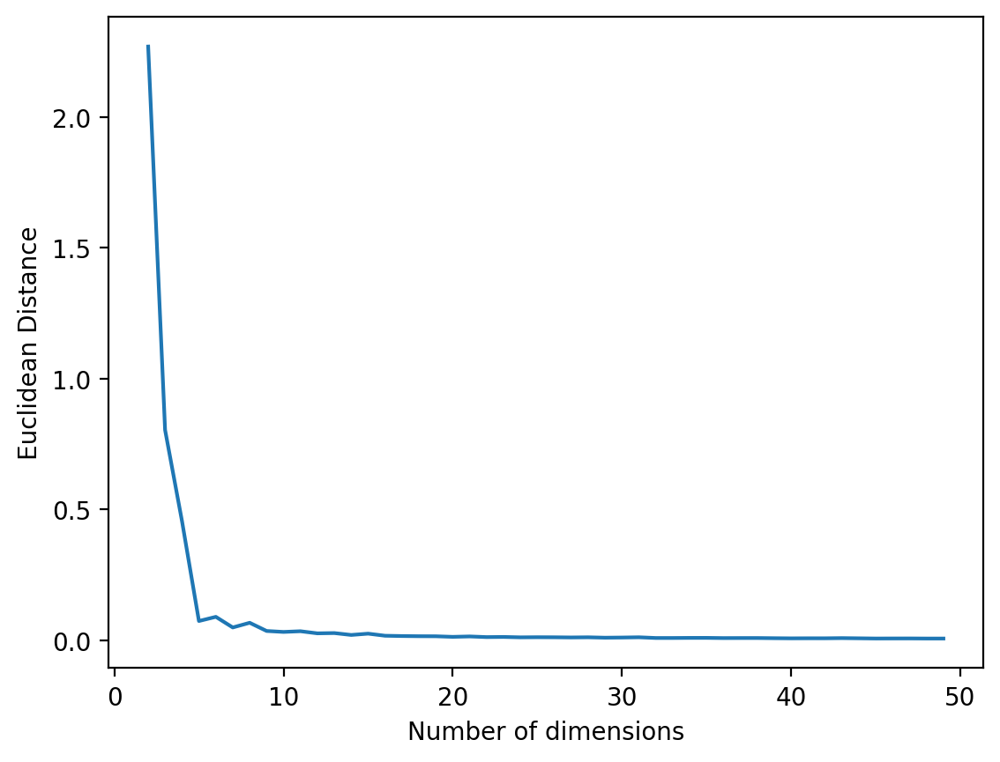

In [3]:
deltas = []
for N in range(2,50):
    # Generate 1000 random points in N dimensions.
    P = [np.random.randint(-100, 100, N) for _ in range(10000)]
    Q = np.random.randint(-100,100, N)
    diffs = [np.linalg.norm(p-Q) for p in P]
    mxd = max(diffs)
    mnd = min(diffs)
    delta = math.log10(mxd-mnd)/mnd
    deltas.append( delta )

plt.plot(range(2,50),deltas)
plt.xlabel('Number of dimensions')
plt.ylabel('Euclidean Distance')
plt.show()

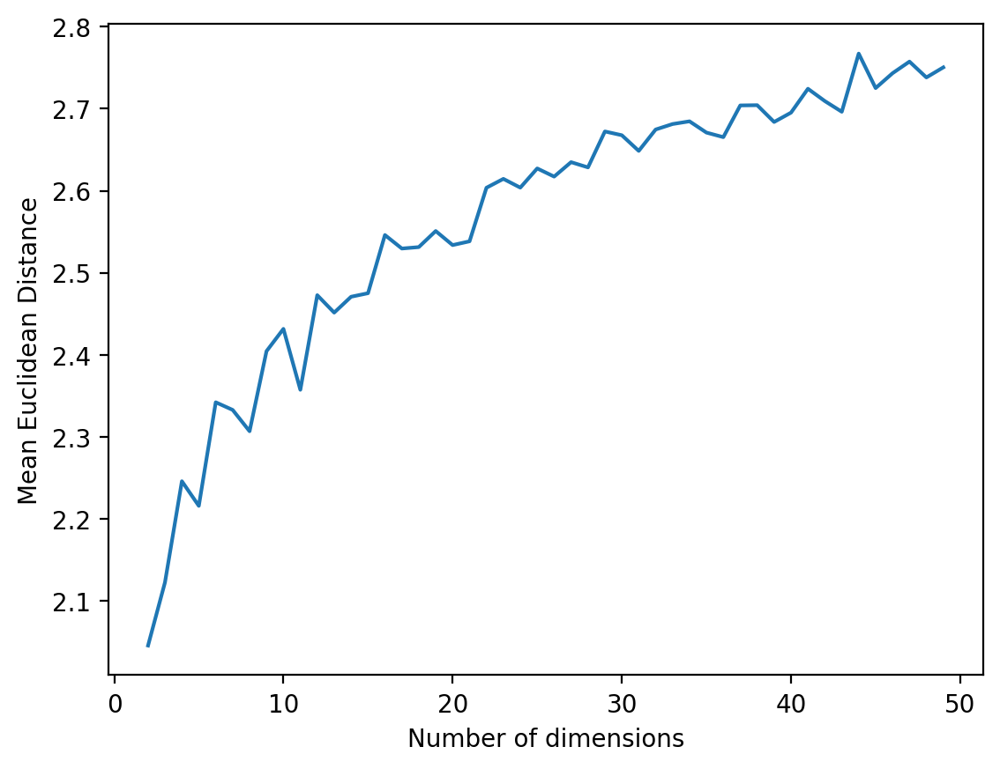

In [4]:
deltas = []
for N in range(2,50):
    # Generate 1000 random points in N dimensions.
    P = [np.random.randint(-100, 100, N) for _ in range(10000)]
    Q = np.random.randint(-100,100,N)
    diffs = [np.linalg.norm(p-Q) for p in P]
    mnd = min(diffs)
    delta = math.log10(np.mean(diffs))
    deltas.append( delta )

plt.plot(range(2,50),deltas)
plt.xlabel('Number of dimensions')
plt.ylabel('Mean Euclidean Distance')
plt.show()

Для того, чтобы уменьшить влияние проклятия размерности, используются разные техники:
 - Feature selection. Выбор наиболее релевантных функций из набора данных может помочь уменьшить размерность и повысить производительность модели.
 - Снижение размерности. Такие методы, как анализ главных компонент (PCA), линейный дискриминантный анализ (LDA) и t-SNE, могут использоваться для уменьшения размерности данных при сохранении наиболее важной информации.
 - Регуляризация. Методы регуляризации, такие как L1 и L2, могут помочь предотвратить переобучение в многомерных наборах данных путем добавления штрафного члена к функции потерь.
 - Ансамблевые методы. Объединение результатов нескольких моделей также может помочь повысить производительность в многомерных наборах данных.
 - Увеличение размера набора обучающих данных также может помочь преодолеть проклятие размерности, однако сбор большего количества данных может занять много времени и стоит дорого.
 - Генерация синтетических данных. Генерацию синтетических данных также можно использовать для увеличения размера набора данных, особенно когда сбор большего количества реальных данных невозможен.

В этом ноутбуке мы рассмотрим некоторые методы оценки важности признаков, а также их отбора на основе важности. 

### Feature selection

UCI MAGIC dataset: https://archive.ics.uci.edu/ml/datasets/magic+gamma+telescope

Описание признаков:

- Length: continuous # major axis of ellipse [mm]
- Width: continuous # minor axis of ellipse [mm]
- Size: continuous # 10-log of sum of content of all pixels [in #phot]
- Conc: continuous # ratio of sum of two highest pixels over fSize [ratio]
- Conc1: continuous # ratio of highest pixel over fSize [ratio]
- Asym: continuous # distance from highest pixel to center, projected onto major axis [mm]
- M3Long: continuous # 3rd root of third moment along major axis [mm]
- M3Trans: continuous # 3rd root of third moment along minor axis [mm]
- Alpha: continuous # angle of major axis with vector to origin [deg]
- Dist: continuous # distance from origin to center of ellipse [mm]
- Label: g,h # gamma (signal), hadron (background)

g = gamma (signal): 12332 

h = hadron (background): 6688

In [5]:
columns = np.array(["Length", "Width", "Size", "Conc", "Conc1", "Asym", "M3Long", "M3Trans", "Alpha", "Dist"])

data = pd.read_csv(pjoin(data_path, "magic.txt"),header=None, names=list(columns)+["Label"])

In [6]:
X = data[columns].values
y = 1 * (data['Label'].values == "g")

In [7]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.5, random_state=11, stratify=y)

**Задание**: Проведите краткий EDA, определите, как выглядят признаки, есть ли пропуски итд

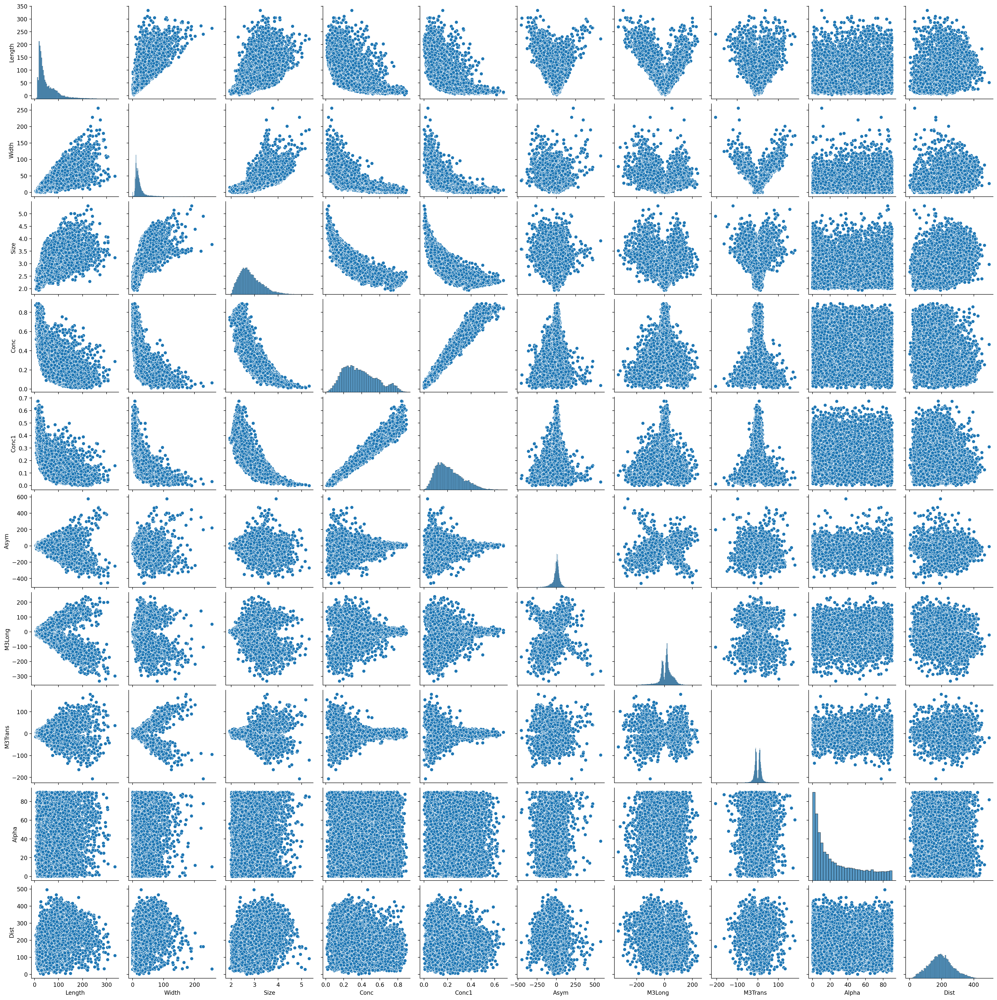

In [8]:
import seaborn as sns
sns.pairplot(data)

In [9]:
def plot_feature_importances(f_imps, f_names, title=""):
    f_imps = np.array(f_imps)
    f_names = np.array(f_names)
    sort_inds = np.argsort(f_imps)
    yy = np.arange(len(f_imps)).astype(int)
    plt.barh(yy, f_imps[sort_inds])
    plt.yticks(yy, f_names[sort_inds], size=14)
    plt.xticks(size=14)
    plt.xlabel("Feature importance", size=14)
    plt.title(title, size=14)
        
    # Add importance scores as labels on the horizontal bar chart
    for i, v in enumerate(f_imps[sort_inds]):
        plt.text(v + 0.01, i, str(round(v, 3)), color="black", fontweight="bold")
    plt.show()


## Оценка важности признаков

Оценка важности признаков сильно переплетена с методами интерпретации моделей. Так, существуют модели, интерпретируемые по определению (такие как линейная или дерево решений), для других моделей необходимо использовать внешние (post-hoc) методы.

При этом интерпретация разделяется еще и на локальную и глобальную. Первый тип отвечает на вопрос - как принимается решение для конкретного объекта, второй же - анализ модели в целом. В этом ноутбуке мы будем рассматривать именно данный тип интерпретации. 

Приложение полученных выводов может быть разным, в зависимости от предметной области. например:
 - какие показатели здоровья важны для отнесения пациента к той или иной группе
 - какие факторы влияют на вероятность выдачи кредита
 - как именно строится предпочтение пользователя в выборе фильма
итд


### Оценка признаков по определению

Классическая линейная модель имеет вид:

$y = \beta_0 + \beta_1 x_1 + \beta_2 x_2 + \ldots + \beta_n x_n + \varepsilon$,

где каждый коэффициент $\beta_i$ показывает изменения отклика ;$y$ при увеличении признака $x_i$ на 1. Благодаря этому мы  явно можем количественно оценить важность каждого признака.

Логистическая модель описывает отношение шансов:

$log {{P(y=1)} \over {P(y=0)} }= \beta_0 + \beta_1 x_1 + \beta_2 x_2 + \ldots + \beta_n x_n + \varepsilon$

где соответственно коэффициенты отражают вклад признака в изменение шансов.

Для деревьев решений оценка важности чуть сложнее.
На значимость каждого признака влияют:
- как часто признак использовался в правилах во внутренних узлах дерева
- какое число обучающих объектов прошло через узлы, использующие признак
- насколько правилам в этих узлах удавалось снизить неопределённость прогнозов

Пусть $T(f)$ все ноды, использующие фичу $f$ для разбиения. Tогда, важность фичи $Imp(f)$ of $f$:
    $$Imp(f) = \sum_{t \in T(f)} n_t \Delta I(t),$$
    $$\Delta I(t) = I(t) - \sum_{c \in children} \frac{n_c}{n_t} I(c),$$
где $n_{t}$ - число объектов в ноде $t$; $I(t)$ – impurity function (gini, cross-entropy, MSE) в ноде $t$

Величина $\Delta I(t)$ представляет собой среднее изменение неопределенности (impurity) при разбиении ноды $t$ по признаку $f$. Она вычисляется как разность между неопределенностью в родительской ноде $I(t)$ и взвешенной суммой неопределенностей в дочерних нодах. Важность признака $Imp(f)$ является взвешенной суммой средних изменений неопределенности по всем нодам, использующим этот признак для разбиения, где веса пропорциональны количеству объектов в каждой ноде. 

При этом лучше использовать этот метод не по единичному дереву, а по ансамблю, так как деревья склонны переобучаться при построении до самого конца (что нужно для рассчета). В случае ансамбля важности фичей усредняются между деревьями.


Рассмотрим пару примеров, на которых можно сравнить разные семейства и их интерпретацию.

In [10]:
from sklearn.datasets import make_classification

X_synth_clf, y_synth_clf = make_classification(
    n_samples=1000, n_features=5, n_informative=3, n_redundant=1, 
    n_clusters_per_class=1, random_state=42
)

X_synth_clf[:, 0] = X_synth_clf[:, 0] * 1000
X_synth_clf[:, 1] = X_synth_clf[:, 1] * 0.1
X_synth_clf[:, 2] = X_synth_clf[:, 2] * 100

feature_names_clf = [f'Feature_{i}' for i in range(X_synth_clf.shape[1])]

X_train_clf, X_test_clf, y_train_clf, y_test_clf = train_test_split(
    X_synth_clf, y_synth_clf, test_size=0.2, random_state=42
)


In [11]:
lr_clf_raw = LogisticRegression(max_iter=1000, random_state=42)
lr_clf_raw.fit(X_train_clf, y_train_clf)
lr_importance_clf_raw = np.abs(lr_clf_raw.coef_[0])

rf_clf_raw = RandomForestClassifier(n_estimators=100, random_state=42)
rf_clf_raw.fit(X_train_clf, y_train_clf)
rf_importance_clf_raw = rf_clf_raw.feature_importances_

scaler_clf = StandardScaler()
X_train_clf_scaled = scaler_clf.fit_transform(X_train_clf)
X_test_clf_scaled = scaler_clf.transform(X_test_clf)

lr_clf_scaled = LogisticRegression(max_iter=1000, random_state=42)
lr_clf_scaled.fit(X_train_clf_scaled, y_train_clf)
lr_importance_clf_scaled = np.abs(lr_clf_scaled.coef_[0])

rf_clf_scaled = RandomForestClassifier(n_estimators=100, random_state=42)
rf_clf_scaled.fit(X_train_clf_scaled, y_train_clf)
rf_importance_clf_scaled = rf_clf_scaled.feature_importances_


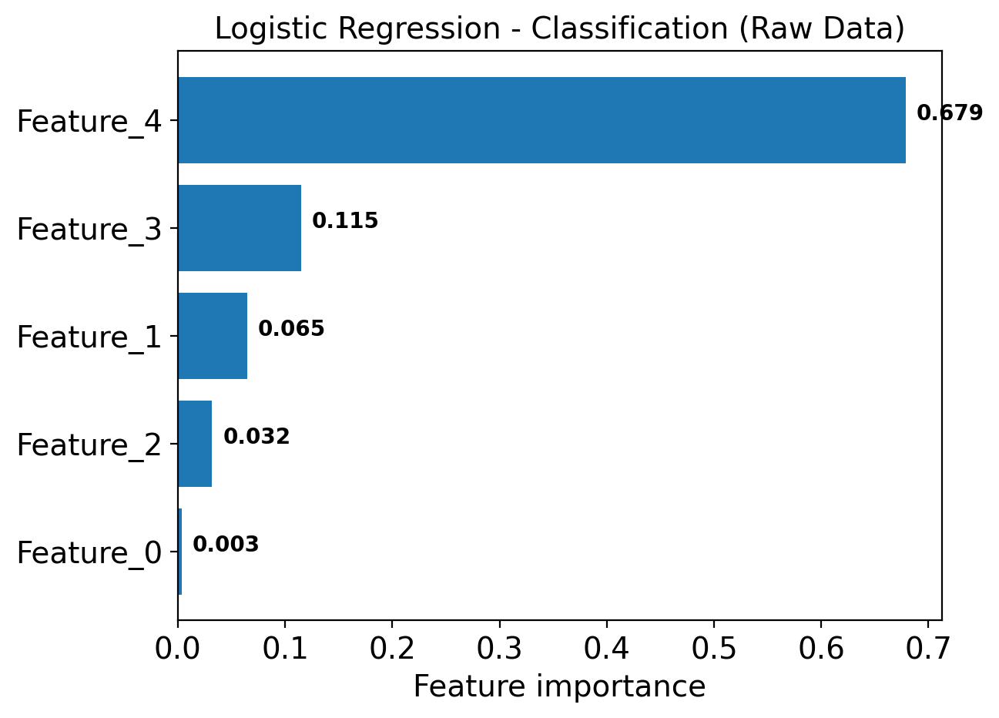

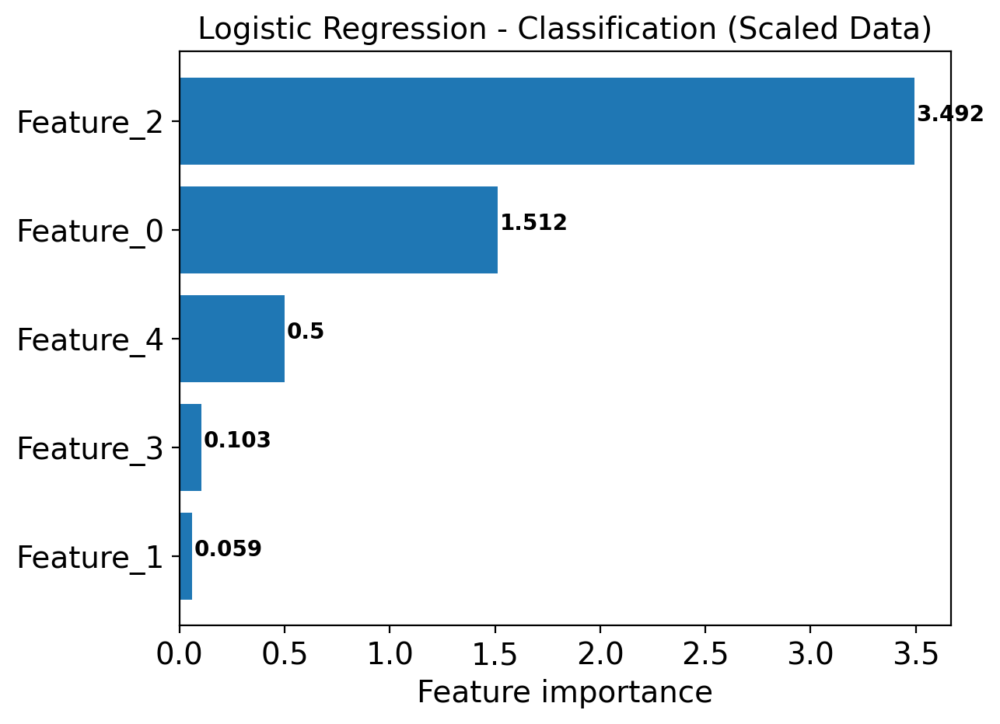

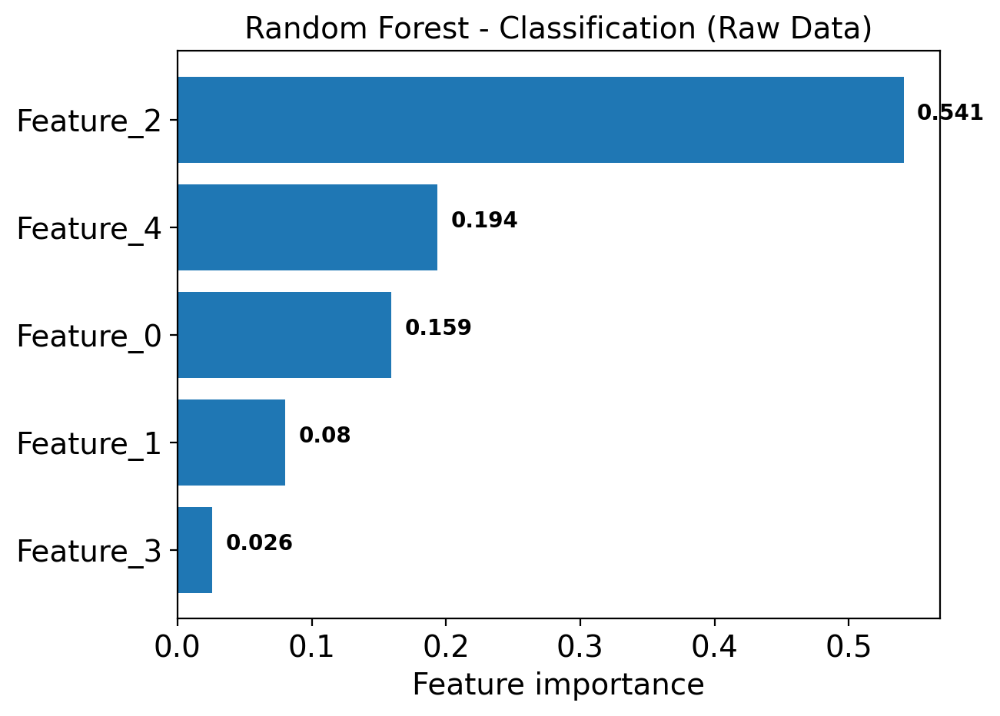

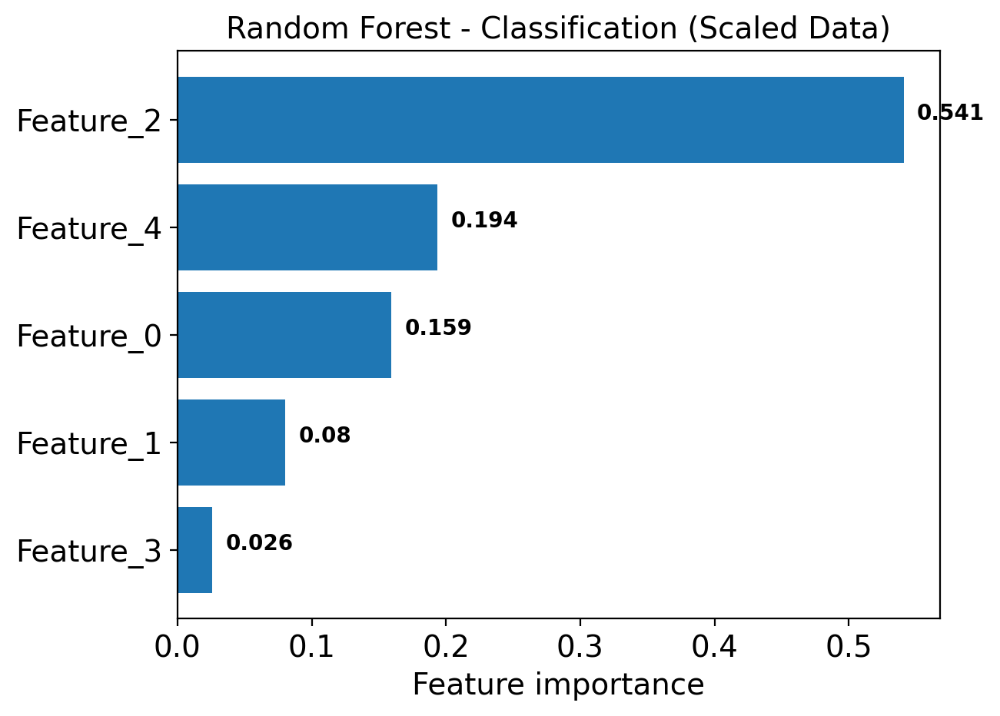

In [12]:
plot_feature_importances(lr_importance_clf_raw, feature_names_clf, 
                         title="Logistic Regression - Classification (Raw Data)")
plot_feature_importances(lr_importance_clf_scaled, feature_names_clf, 
                         title="Logistic Regression - Classification (Scaled Data)")
plot_feature_importances(rf_importance_clf_raw, feature_names_clf, 
                         title="Random Forest - Classification (Raw Data)")
plot_feature_importances(rf_importance_clf_scaled, feature_names_clf, 
                         title="Random Forest - Classification (Scaled Data)")


In [13]:
from sklearn.datasets import make_regression

X_synth_reg, y_synth_reg = make_regression(
    n_samples=1000, n_features=5, n_informative=3, noise=10, random_state=42
)
feature_names_reg = [f'Feature_{i}' for i in range(X_synth_reg.shape[1])]

X_train_reg, X_test_reg, y_train_reg, y_test_reg = train_test_split(
    X_synth_reg, y_synth_reg, test_size=0.2, random_state=42
)

lr_reg_raw = LinearRegression()
lr_reg_raw.fit(X_train_reg, y_train_reg)
lr_importance_reg_raw = np.abs(lr_reg_raw.coef_)

rf_reg_raw = RandomForestRegressor(n_estimators=100, random_state=42)
rf_reg_raw.fit(X_train_reg, y_train_reg)
rf_importance_reg_raw = rf_reg_raw.feature_importances_

scaler_reg = StandardScaler()
X_train_reg_scaled = scaler_reg.fit_transform(X_train_reg)
X_test_reg_scaled = scaler_reg.transform(X_test_reg)

lr_reg_scaled = LinearRegression()
lr_reg_scaled.fit(X_train_reg_scaled, y_train_reg)
lr_importance_reg_scaled = np.abs(lr_reg_scaled.coef_)

rf_reg_scaled = RandomForestRegressor(n_estimators=100, random_state=42)
rf_reg_scaled.fit(X_train_reg_scaled, y_train_reg)
rf_importance_reg_scaled = rf_reg_scaled.feature_importances_


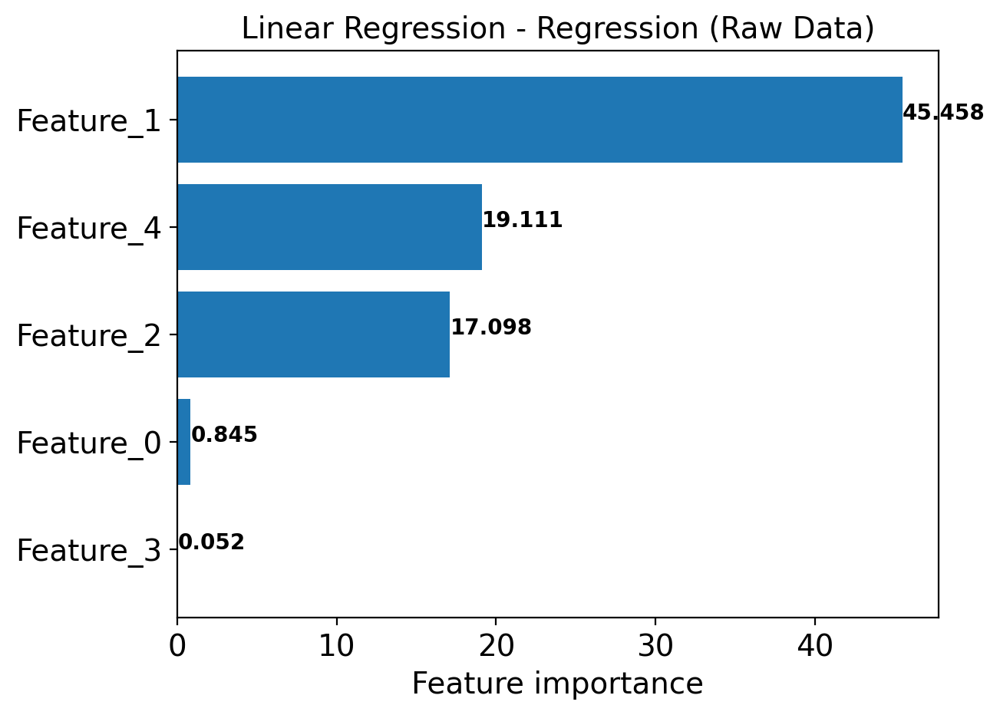

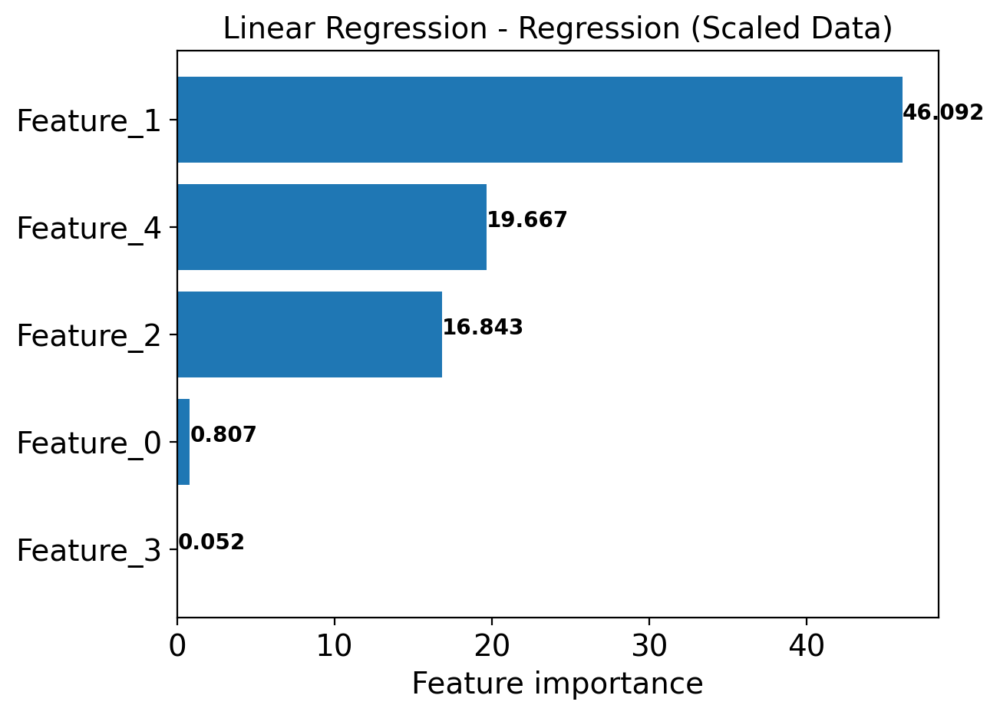

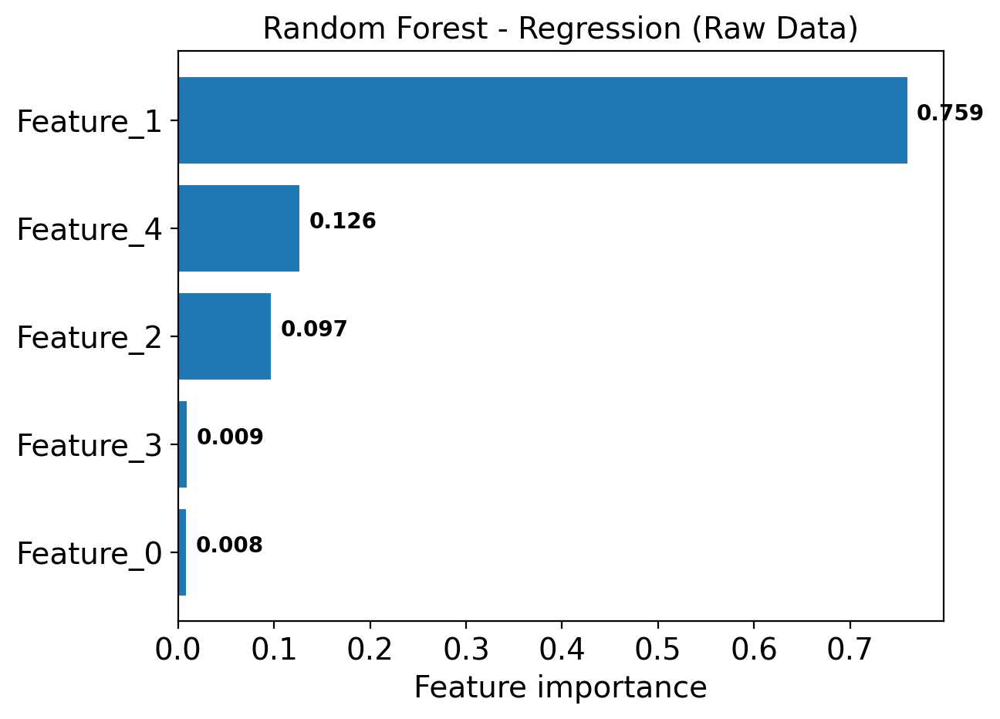

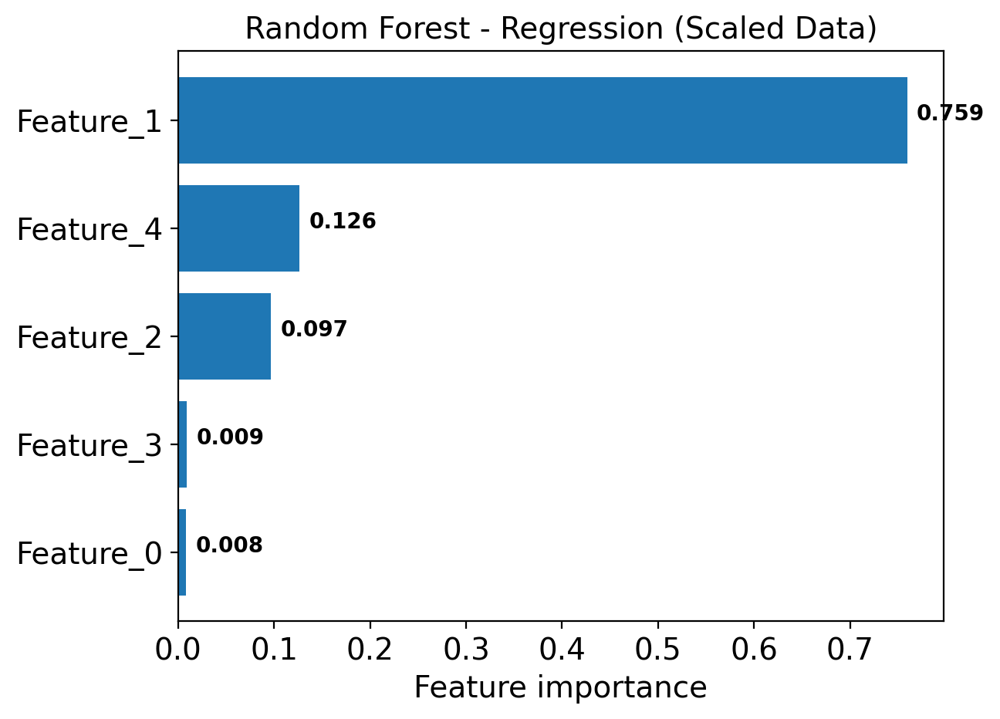

In [14]:
plot_feature_importances(lr_importance_reg_raw, feature_names_reg, 
                         title="Linear Regression - Regression (Raw Data)")
plot_feature_importances(lr_importance_reg_scaled, feature_names_reg, 
                         title="Linear Regression - Regression (Scaled Data)")
plot_feature_importances(rf_importance_reg_raw, feature_names_reg, 
                         title="Random Forest - Regression (Raw Data)")
plot_feature_importances(rf_importance_reg_scaled, feature_names_reg, 
                         title="Random Forest - Regression (Scaled Data)")


### Пример на датасете MAGIC


In [15]:
lr_magic_raw = LogisticRegression(max_iter=1000, random_state=42)
lr_magic_raw.fit(X_train, y_train)
lr_importance_magic_raw = np.abs(lr_magic_raw.coef_[0])

rf_magic_raw = RandomForestClassifier(n_estimators=100, random_state=42)
rf_magic_raw.fit(X_train, y_train)
rf_importance_magic_raw = rf_magic_raw.feature_importances_

scaler_magic = StandardScaler()
X_train_magic_scaled = scaler_magic.fit_transform(X_train)
X_test_magic_scaled = scaler_magic.transform(X_test)

lr_magic_scaled = LogisticRegression(max_iter=1000, random_state=42)
lr_magic_scaled.fit(X_train_magic_scaled, y_train)
lr_importance_magic_scaled = np.abs(lr_magic_scaled.coef_[0])

rf_magic_scaled = RandomForestClassifier(n_estimators=100, random_state=42)
rf_magic_scaled.fit(X_train_magic_scaled, y_train)
rf_importance_magic_scaled = rf_magic_scaled.feature_importances_


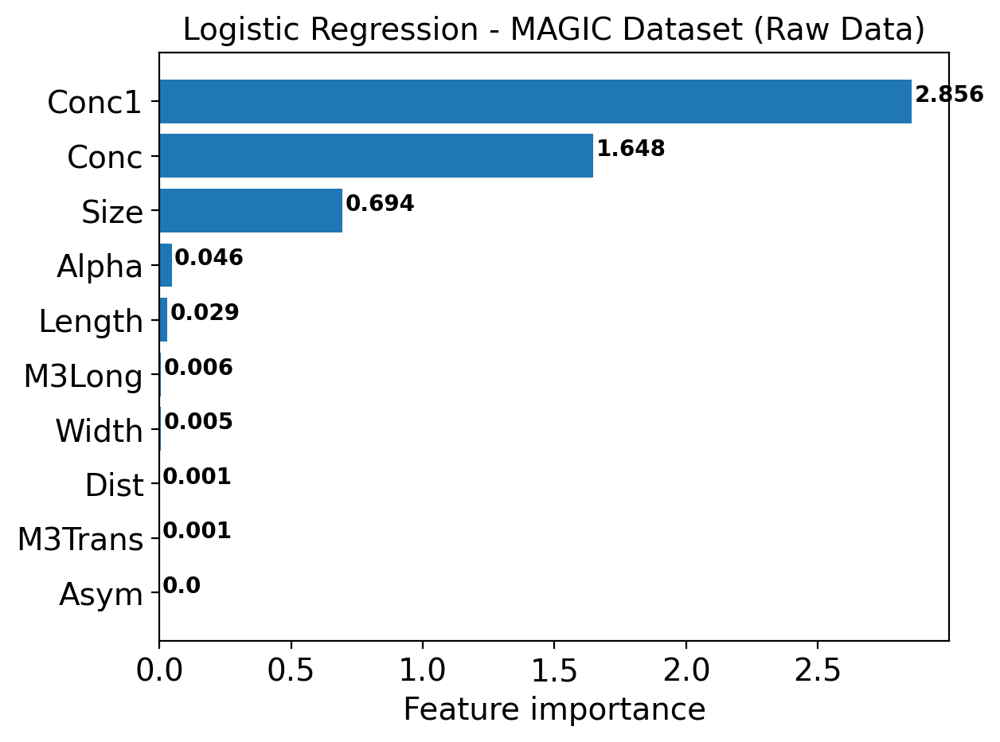

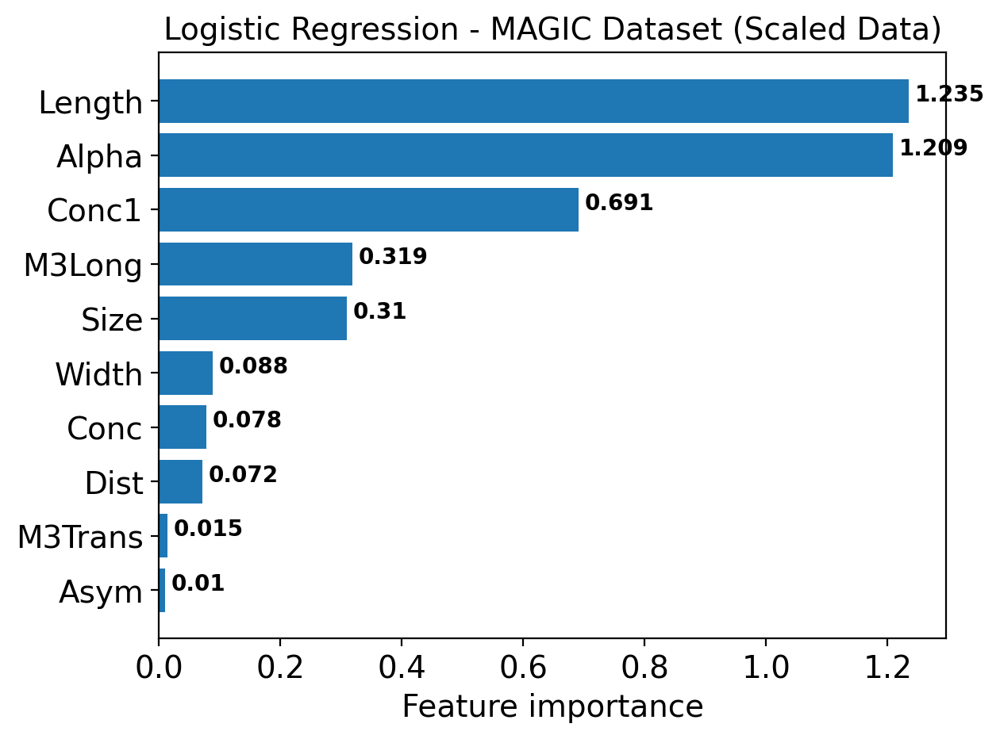

In [16]:
plot_feature_importances(lr_importance_magic_raw, columns, 
                         title="Logistic Regression - MAGIC Dataset (Raw Data)")
plot_feature_importances(lr_importance_magic_scaled, columns, 
                         title="Logistic Regression - MAGIC Dataset (Scaled Data)")


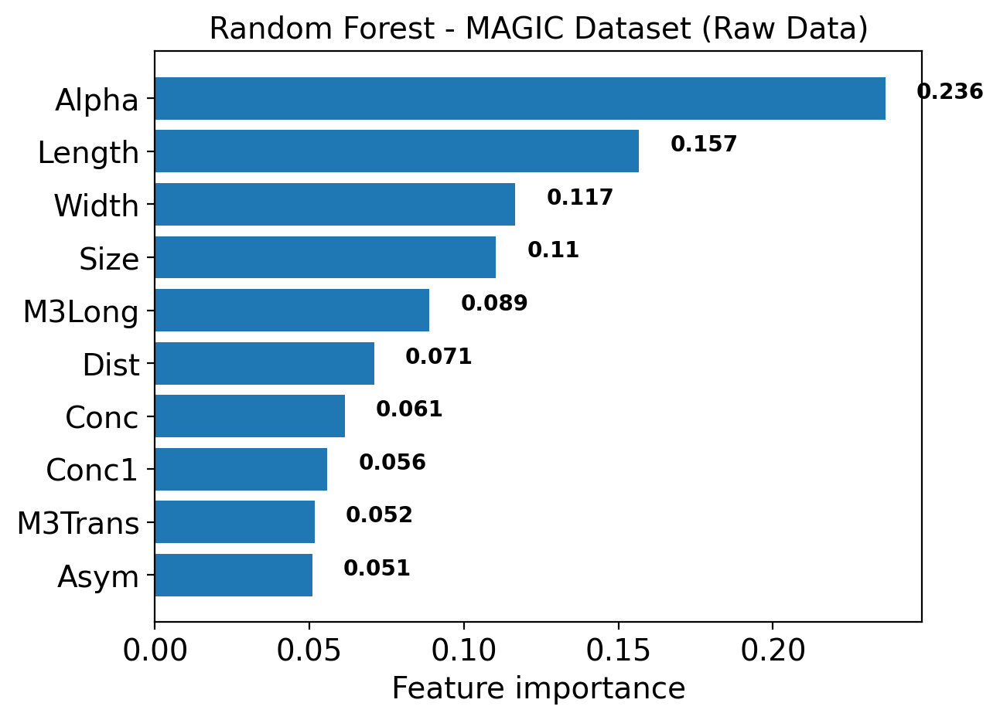

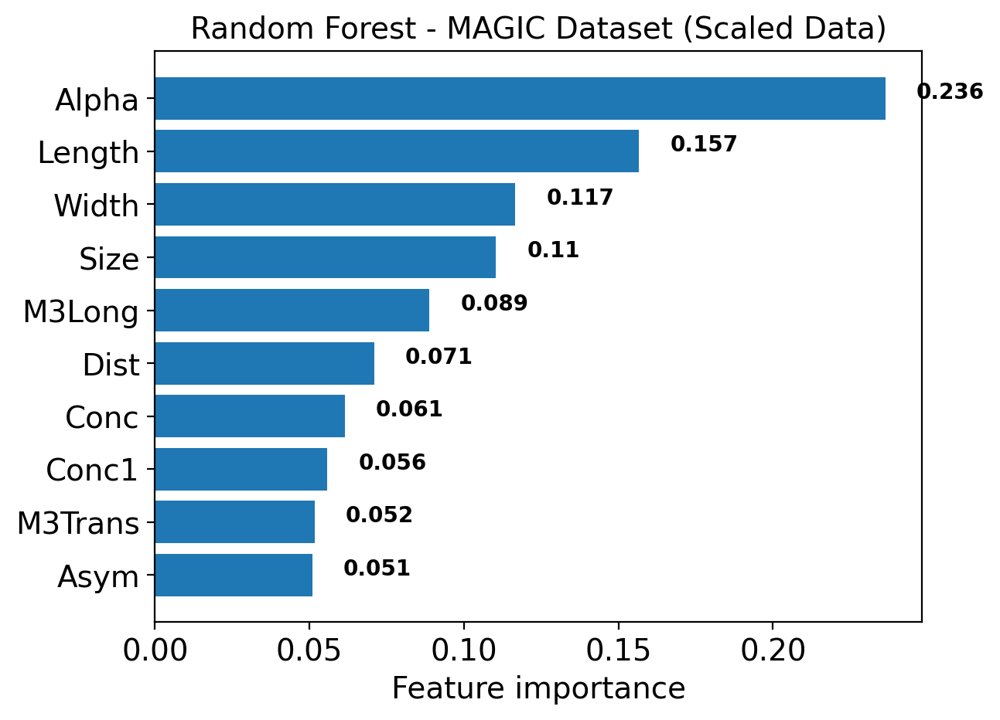

In [17]:

plot_feature_importances(rf_importance_magic_raw, columns, 
                         title="Random Forest - MAGIC Dataset (Raw Data)")
plot_feature_importances(rf_importance_magic_scaled, columns, 
                         title="Random Forest - MAGIC Dataset (Scaled Data)")

Вопрос: какие из этих признаков можно считать важными? 

По графику Random Forest наиболее важные признаки это:

- **Alpha** — самый важный признак (0.236)
- **Length** (0.157)
- **Width** (0.117)
- **Size** (0.110)

## Model-agnostic methods

###  Information gain 
Самый простой способ выбора признаков - Information gain (прирост информации). 

Энтропия целевой переменной Y:
$$H(Y) = -\sum_{i=1}^{c} p(y_i) \log_2 p(y_i)$$
где:
$c$ — число классов
$p(y_i)$ — вероятность класса $y_i$

Условная энтропия Y при известном признаке X:
$$H(Y|X) = -\sum_{j=1}^{m} p(x_j) \sum_{i=1}^{c} p(y_i|x_j) \log_2 p(y_i|x_j)$$
где:
$m$ — число значений признака X
$p(x_j)$ — вероятность значения $x_j$
$p(y_i|x_j)$ — условная вероятность класса $y_i$ при значении $x_j$

Прирост информации - (I(X , Y) = H(X) – H(X | Y)). Это статистика, которая измеряет снижение энтропии (неопределенности) для конкретной функции (таргета) путем деления данных в соответствии с этой характеристикой. 


Она часто используется в алгоритмах дерева решений, а также имеет другие полезные свойства. Чем выше прирост информации от признака использования признака, тем полезнее он для принятия решений.

Для дискретных признаков необходимо следующее:
1. Вычислить энтропию целевой переменной: $H(Y)$
2. Для каждого признака $X$:
   1. Разделить данные по значениям $X$
   2. Вычислить условную энтропию $H(Y|X)$
   3. Вычислить $IG(Y, X) = H(Y) - H(Y|X)$

Вопрос: что дальше необходимо сделать, если это происходит во время построения дерева решений?

Для непрерывных признаков сначала необходимо провести дискретизацию(бининг). 

Вопросы: 
 1) зависит ли результат от масштаба данных?
 2) требует ли такое вычисление каких-то знаний о распределениях в данных? Является ли он параметрическим?

 В чем проблема этого метода - IG может быть выше для признаков с множеством уникальных значений, соответственно, и оценка важности будет смещена. Кроме того, никак не учитывается их взаимодействие. 

Для снижения смещения к признакам с большим числом значений используется Information Gain Ratio:
$$IGR(Y, X) = \frac{IG(Y, X)}{H(X)} = \frac{H(Y) - H(Y|X)}{H(X)}$$
Нормализует IG на энтропию признака, уменьшая влияние признаков с высокой энтропией.

В sklearn можно оценить важность признаков с помощью mutual_info_regression.


In [18]:
# Apply Information Gain
ig = mutual_info_regression(X_train, y_train)

# Create a dictionary of feature importance scores
feature_scores = {}
for i, col in enumerate(list(columns)):
    feature_scores[col ] = ig[i]

# Sort the features by importance score in descending order
sorted_features = sorted(feature_scores.items(), key=lambda x: x[1], reverse=True)

# Print the feature importance scores and the sorted features
for feature, score in sorted_features:
    print(f"Feature: {feature}, Score: {score}")

Feature: Alpha, Score: 0.12084904421357834
Feature: Width, Score: 0.09262125490304207
Feature: Length, Score: 0.07524222257910118
Feature: M3Long, Score: 0.07025912327448758
Feature: M3Trans, Score: 0.05940861220875071
Feature: Size, Score: 0.041334045876396885
Feature: Asym, Score: 0.03947605008775312
Feature: Conc1, Score: 0.019507635820732006
Feature: Conc, Score: 0.016563279969096456
Feature: Dist, Score: 0.011228329957329919


### F-test

F-test (F-тест) — это статистический метод для оценки важности признаков, основанный на проверке статистических гипотез. Он сравнивает две модели: нулевую модель (только константа) и альтернативную модель (константа + признак), чтобы определить, вносит ли признак значимый вклад в объяснение целевой переменной.


F-test для оценки важности признаков основан на сравнении дисперсий остатков двух моделей [https://online.stat.psu.edu/stat501/lesson/2/2.6]:

1. **Нулевая модель (H₀)**: $y = \beta_0 + \epsilon$ — модель только с константой (средним значением)
2. **Альтернативная модель (H₁)**: $y = \beta_0 + \beta_1 x_i + \epsilon$ — модель с константой и признаком $x_i$

Идея заключается в том, что если признак $x_i$ действительно важен, то добавление его в модель должно значительно уменьшить сумму квадратов остатков: 

SSR - regression sum of squares. Это сумма квадратов отклонений, объясненная моделью. $SSR = \sum_{i=1}^{n}(\hat{y}i - \bar{y})^2$

SSE - сумма квадратов ошибок (необъяснённая)ю $SSE = \sum_{i=1}^{n}(y_i - \hat{y}i)^2$

$MSE = {SSE \over(n-2)}$ ( т.к. два параметра - коэффициенты при свободном члене и признаке)

SSTO = SSR + SSE: $SSTO = \sum_{i=1}^{n}(y_i - \bar{y})^2$

$ F = {MSR \over {MSE}} = {{SSR} \over {SSE \ (n-2)}} = {{SSR (n - 2)} \over {SSE}} = {(n - 2){\sum (\hat{y}_i - \overline{y} )^2 } \over {{\sum (\hat{y}_i - y_i )^2 }}} $.


F-статистика следует F-распределению с степенями свободы $(1, n-2)$ при справедливости нулевой гипотезы. Т.е.:
- **Высокая F-статистика** и **низкий p-value** (< 0.05) указывают на то, что признак статистически значим и вносит важный вклад в модель
- **Низкая F-статистика** и **высокий p-value** (> 0.05) указывают на то, что признак не является значимым


Признаки ранжируются по убыванию F-статистики или по возрастанию p-value. Кроме того, можно выполнять последовательный тест, сначала найдя важности всех признаков по одному, сравнивая $M0$ и $M1$, далее, выбрав лучшую фичу, использовать $M1$ как базовую модель и создавать уже $M2$ со всем и остальными фичами, и так далее..


Если мы знаем $r^2$, то мы можем посчитать F исходя из него:
$r^2 = SSR / SSTO => 1 - r^2 = SSE / SSTO $

$E[(X_i - mean(X_i)) * (y - mean(y))] / (std(X_i) * std(y))$ 

Тогда:
$$F = \frac{r^2}{1 - r^2} \cdot (n - 2)$$

В простой линейной регрессии коэффициент детерминации равен квадрату коэффициента корреляции. Это означает, что F-test по сути проверяет значимость линейной корреляции между признаком и целевой переменной.

Исходя из вышеперечисленного, какие недостатки у этого метода?


F-test результаты для датасета MAGIC:
Feature: Alpha                F-statistic:    2642.33 p-value: 0.00e+00 ***
Feature: Length               F-statistic:     988.38 p-value: 1.74e-206 ***
Feature: Width                F-statistic:     697.80 p-value: 1.87e-148 ***
Feature: M3Long               F-statistic:     366.94 p-value: 2.79e-80 ***
Feature: Asym                 F-statistic:     286.07 p-value: 2.99e-63 ***
Feature: Size                 F-statistic:     136.18 p-value: 2.98e-31 ***
Feature: Dist                 F-statistic:      41.61 p-value: 1.17e-10 ***
Feature: Conc                 F-statistic:       4.27 p-value: 3.87e-02 *
Feature: M3Trans              F-statistic:       0.36 p-value: 5.47e-01 
Feature: Conc1                F-statistic:       0.00 p-value: 9.52e-01 


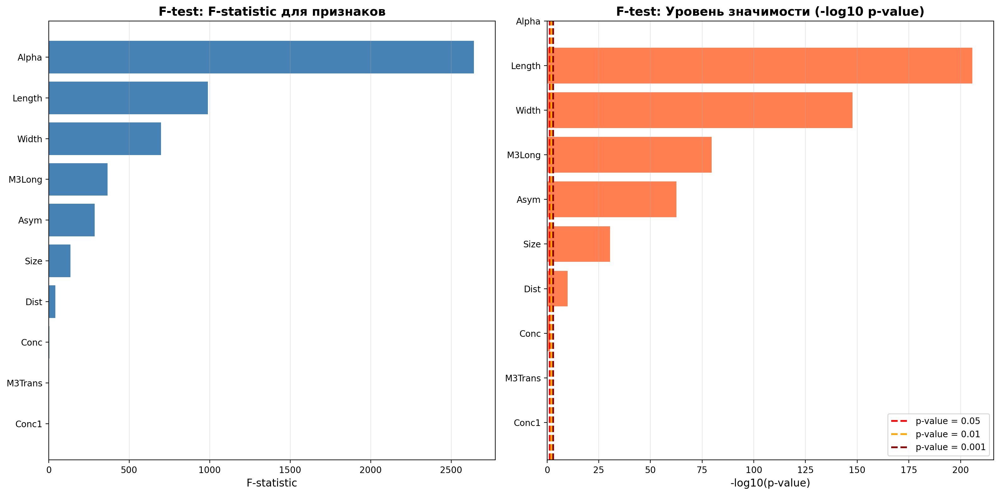


Количество значимых признаков (p-value < 0.05): 8
Количество высокозначимых признаков (p-value < 0.01): 7
Количество очень высокозначимых признаков (p-value < 0.001): 7


In [19]:
f_statistic, p_values = f_classif(X_train, y_train)
feature_scores = {}
for i, col in enumerate(list(columns)):
    feature_scores[col] = (f_statistic[i], p_values[i])

sorted_features = sorted(
    feature_scores.items(), key=lambda x: x[1][0], reverse=True
)

print("F-test результаты для датасета MAGIC:")
print("=" * 60)
for feature, score in sorted_features:
    significance = "***" if score[1] < 0.001 else "**" if score[1] < 0.01 else "*" if score[1] < 0.05 else ""
    print(f"Feature: {feature:20s} F-statistic: {score[0]:10.2f} p-value: {score[1]:.2e} {significance}")

ftest_df = pd.DataFrame({
    'Feature': [f[0] for f in sorted_features],
    'F-statistic': [f[1][0] for f in sorted_features],
    'p-value': [f[1][1] for f in sorted_features]
})

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

y_pos = np.arange(len(ftest_df))
ax1.barh(y_pos, ftest_df['F-statistic'], color='steelblue')
ax1.set_yticks(y_pos)
ax1.set_yticklabels(ftest_df['Feature'])
ax1.set_xlabel('F-statistic', fontsize=12)
ax1.set_title('F-test: F-statistic для признаков', fontsize=14, fontweight='bold')
ax1.invert_yaxis()
ax1.grid(axis='x', alpha=0.3)

ax2.barh(y_pos, -np.log10(ftest_df['p-value']), color='coral')
ax2.axvline(x=-np.log10(0.05), color='red', linestyle='--', linewidth=2, label='p-value = 0.05')
ax2.axvline(x=-np.log10(0.01), color='orange', linestyle='--', linewidth=2, label='p-value = 0.01')
ax2.axvline(x=-np.log10(0.001), color='darkred', linestyle='--', linewidth=2, label='p-value = 0.001')
ax2.set_yticks(y_pos)
ax2.set_yticklabels(ftest_df['Feature'])
ax2.set_xlabel('-log10(p-value)', fontsize=12)
ax2.set_title('F-test: Уровень значимости (-log10 p-value)', fontsize=14, fontweight='bold')
ax2.invert_yaxis()
ax2.legend()
ax2.grid(axis='x', alpha=0.3)

plt.tight_layout()
plt.show()

print(f"\nКоличество значимых признаков (p-value < 0.05): {sum(ftest_df['p-value'] < 0.05)}")
print(f"Количество высокозначимых признаков (p-value < 0.01): {sum(ftest_df['p-value'] < 0.01)}")
print(f"Количество очень высокозначимых признаков (p-value < 0.001): {sum(ftest_df['p-value'] < 0.001)}")

F-test также может использоваться для задач регрессии с помощью функции `f_regression`.


Вопрос: Какие из столбцов можно считать важными, основываясь на этом тесте? Поясните свой ответ

Задание: 
1) Постройте модель логистической регрессии, используя все признаки из набора.
2) Также постройте модели для выбранных наборов признаков. 
3) Сравните модели по точности, используя кросс-валидацию. 

Задание: Покажите, как будет меняться оценка важности признаков линейной модели при добавлении выбросов и нелинейных зависимостей. Сравните с оценкой по коэффициентам.

In [24]:
# Задание Logistic Regression

from sklearn.feature_selection import mutual_info_classif

models = {
    "all features": Pipeline([
        ("scaler", StandardScaler()),
        ("model", LogisticRegression(max_iter=1000, random_state=42))
    ]),
    
    "top 3 by F-test": Pipeline([
        ("select", SelectKBest(score_func=f_classif, k=3)),
        ("scaler", StandardScaler()),
        ("model", LogisticRegression(max_iter=1000, random_state=42))
    ]),
    
    "top 5 by F-test": Pipeline([
        ("select", SelectKBest(score_func=f_classif, k=5)),
        ("scaler", StandardScaler()),
        ("model", LogisticRegression(max_iter=1000, random_state=42))
    ]),
    
    "top 5 by mutual info": Pipeline([
        ("select", SelectKBest(score_func=mutual_info_classif, k=5)),
        ("scaler", StandardScaler()),
        ("model", LogisticRegression(max_iter=1000, random_state=42))
    ])
}

cv_results = []

for name, model in models.items():
    acc = cross_val_score(model, X, y, scoring="accuracy", cv=5)
    roc_auc = cross_val_score(model, X, y, scoring="roc_auc", cv=5)

    cv_results.append({
        "model": name,
        "accuracy_mean": acc.mean(),
        "accuracy_std": acc.std(),
        "roc_auc_mean": roc_auc.mean(),
        "roc_auc_std": roc_auc.std()
    })

cv_results = pd.DataFrame(cv_results)
cv_results

,model,accuracy_mean,accuracy_std,roc_auc_mean,roc_auc_std
0,all features,0.790641,0.002637,0.839085,0.004660
1,top 3 by F-test,0.789590,0.000566,0.817078,0.005486
2,top 5 by F-test,0.790011,0.001260,0.822962,0.005606
3,top 5 by mutual info,0.790589,0.001756,0.822842,0.005593


In [26]:
# важность признаков при нелинейных зависимостях

from sklearn.inspection import permutation_importance

np.random.seed(42)

n = 1000

x1 = np.random.normal(0, 1, n)
x2 = np.random.normal(0, 1, n)
x3 = np.random.normal(0, 1, n)

y_synth = 3 * x1 + 5 * (x2 ** 2) + np.random.normal(0, 1, n)

X_synth = np.column_stack([x1, x2, x3])
feature_names = np.array(["linear_feature", "nonlinear_feature", "noise_feature"])

X_train_s, X_test_s, y_train_s, y_test_s = train_test_split(
    X_synth, y_synth, test_size=0.3, random_state=42
)

model = Pipeline([
    ("scaler", StandardScaler()),
    ("linear", LinearRegression())
])

model.fit(X_train_s, y_train_s)

coef_importance = np.abs(model.named_steps["linear"].coef_)

perm = permutation_importance(
    model,
    X_test_s,
    y_test_s,
    scoring="neg_mean_squared_error",
    n_repeats=10,
    random_state=42
)

importance_df = pd.DataFrame({
    "feature": feature_names,
    "coef_importance": coef_importance,
    "permutation_importance": perm.importances_mean
})

importance_df

,feature,coef_importance,permutation_importance
0,linear_feature,2.814890,18.662475
1,nonlinear_feature,0.609827,-0.114064
2,noise_feature,0.041642,0.011102


In [27]:
# важность признаков при выбросах

X_synth_outliers = X_synth.copy()
X_synth_outliers[:30, 0] = X_synth_outliers[:30, 0] * 20

X_train_o, X_test_o, y_train_o, y_test_o = train_test_split(
    X_synth_outliers, y_synth, test_size=0.3, random_state=42
)

model_outliers = Pipeline([
    ("scaler", StandardScaler()),
    ("linear", LinearRegression())
])

model_outliers.fit(X_train_o, y_train_o)

coef_importance_outliers = np.abs(model_outliers.named_steps["linear"].coef_)

perm_outliers = permutation_importance(
    model_outliers,
    X_test_o,
    y_test_o,
    scoring="neg_mean_squared_error",
    n_repeats=10,
    random_state=42
)

importance_outliers_df = pd.DataFrame({
    "feature": feature_names,
    "coef_importance": coef_importance_outliers,
    "permutation_importance": perm_outliers.importances_mean
})

importance_outliers_df

,feature,coef_importance,permutation_importance
0,linear_feature,1.338014,1.914634
1,nonlinear_feature,0.489194,-0.035503
2,noise_feature,0.052505,-0.026105


In [28]:
def print_feature_names(features, original_feature_names: list  | None = None):
  feature_names = [str(original_feature_names[int(f.strip("pixel"))]) for f in features]
  print(f"Selected features: {feature_names}")


def select_features(X_train, y_train, X_test, function, k: int = 5, features: list  | None = None):
 # configure to select a subset of features
 fs = SelectKBest(score_func=function, k=k)
 fs.fit(X_train, y_train)
 print_feature_names(fs.get_feature_names_out(), features)
 X_train_fs = fs.transform(X_train)
 X_test_fs = fs.transform(X_test)
 return X_train_fs, X_test_fs, fs

In [29]:
model = DecisionTreeClassifier()
cross_val_score(
    model, X, y, scoring="accuracy", cv=5
).mean()

np.float64(0.8175604626708728)

In [30]:
results = {"num_features": [], "acc": [], "roc_auc": []}
for i in range(1, len(columns)):
    results["num_features"].append(i)
    # feature selection
    X_train_fs, X_test_fs, fs = select_features(
        X_train, y_train, X_test, f_classif, k=i, features = list(columns)
        )
    # fit the model
    model = DecisionTreeClassifier()
    model.fit(X_train_fs, y_train)
    # evaluate the model
    yhat = model.predict(X_test_fs)
    probs = model.predict_proba(X_test_fs)[:, 1]
    # evaluate predictions
    results["acc"].append(accuracy_score(y_test, yhat))
    results["roc_auc"].append(roc_auc_score(y_test, probs))
results = pd.DataFrame(results)

Selected features: ['Alpha']
Selected features: ['Length', 'Alpha']
Selected features: ['Length', 'Width', 'Alpha']
Selected features: ['Length', 'Width', 'M3Long', 'Alpha']
Selected features: ['Length', 'Width', 'Asym', 'M3Long', 'Alpha']
Selected features: ['Length', 'Width', 'Size', 'Asym', 'M3Long', 'Alpha']
Selected features: ['Length', 'Width', 'Size', 'Asym', 'M3Long', 'Alpha', 'Dist']
Selected features: ['Length', 'Width', 'Size', 'Conc', 'Asym', 'M3Long', 'Alpha', 'Dist']
Selected features: ['Length', 'Width', 'Size', 'Conc', 'Asym', 'M3Long', 'M3Trans', 'Alpha', 'Dist']


In [31]:
results

,num_features,acc,roc_auc
0,1,0.654890,0.623853
1,2,0.747003,0.723738
2,3,0.769611,0.748837
3,4,0.784332,0.765321
4,5,0.786225,0.767602
5,6,0.798738,0.780947
6,7,0.807992,0.790341
7,8,0.813775,0.796033
8,9,0.811777,0.793808


**Задание**: Реализуйте такой метод, используя линейную модель с регуляризацией.

**Бонусное задание**: Сделайте метрику аргументом, проведите тесты с линейной моделью, деревом решений, случайным лесом, двумя метриками. Постройте таблицу со сравнением.

In [33]:
model_l1 = Pipeline([
    ("scaler", StandardScaler()),
    ("select", SelectFromModel(
        LogisticRegression(
            penalty="l1",
            solver="liblinear",
            C=0.1,
            random_state=42
        )
    )),
    ("model", LogisticRegression(max_iter=1000, random_state=42))
])

scores = cross_val_score(
    model_l1,
    X,
    y,
    scoring="accuracy",
    cv=5
)

print("Accuracy:", scores.mean())

Accuracy: 0.7907465825446898


In [34]:
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

selector = SelectFromModel(
    LogisticRegression(
        penalty="l1",
        solver="liblinear",
        C=0.1,
        random_state=42
    )
)

selector.fit(X_scaled, y)

selected_features = columns[selector.get_support()]
selected_features

array(['Length', 'Width', 'Size', 'Conc1', 'M3Long', 'M3Trans', 'Alpha',
       'Dist'], dtype='<U7')

In [35]:
def get_feature_imp_general(X_test, y_test, model, metric="accuracy", random_state=42):
    rng = np.random.RandomState(random_state)
    feature_importances = []

    if metric == "accuracy":
        y_base = model.predict(X_test)
        q_0 = accuracy_score(y_test, y_base)

    elif metric == "roc_auc":
        y_base = model.predict_proba(X_test)[:, 1]
        q_0 = roc_auc_score(y_test, y_base)

    else:
        raise ValueError("metric should be 'accuracy' or 'roc_auc'")

    for i in range(X_test.shape[1]):
        X_test_copy = X_test.copy()

        X_test_copy[:, i] = rng.permutation(X_test_copy[:, i])

        if metric == "accuracy":
            y_perm = model.predict(X_test_copy)
            q_r = accuracy_score(y_test, y_perm)

        elif metric == "roc_auc":
            y_perm = model.predict_proba(X_test_copy)[:, 1]
            q_r = roc_auc_score(y_test, y_perm)

        importance = q_0 - q_r
        feature_importances.append(importance)

    return np.array(feature_importances)

In [36]:
# Проверка функции на модели

model = Pipeline([
    ("scaler", StandardScaler()),
    ("model", LogisticRegression(max_iter=1000, random_state=42))
])

model.fit(X_train, y_train)

imps = get_feature_imp_general(
    X_test,
    y_test,
    model,
    metric="roc_auc"
)

imp_df = pd.DataFrame({
    "feature": columns,
    "importance": imps
}).sort_values("importance", ascending=False)

imp_df

,feature,importance
8,Alpha,0.204241
0,Length,0.108709
4,Conc1,0.059287
6,M3Long,0.014247
2,Size,0.003282
7,M3Trans,0.000054
5,Asym,0.000027
9,Dist,-0.000391
1,Width,-0.000920
3,Conc,-0.001314


In [37]:
# Бонусное задание

models = [
    ("Logistic Regression", Pipeline([
        ("scaler", StandardScaler()),
        ("model", LogisticRegression(max_iter=1000, random_state=42))
    ])),
    ("Decision Tree", DecisionTreeClassifier(random_state=42)),
    ("Random Forest", RandomForestClassifier(n_estimators=100, random_state=42))
]

metrics = ["accuracy", "roc_auc"]

records = []

for model_name, model in models:
    model.fit(X_train, y_train)

    for metric in metrics:
        imps = get_feature_imp_general(
            X_test,
            y_test,
            model,
            metric=metric
        )

        for feature, importance in zip(columns, imps):
            records.append({
                "model": model_name,
                "metric": metric,
                "feature": feature,
                "importance": importance
            })

importance_results = pd.DataFrame(records)

importance_results.head()

,model,metric,feature,importance
0,Logistic Regression,accuracy,Length,0.103155
1,Logistic Regression,accuracy,Width,0.001052
2,Logistic Regression,accuracy,Size,0.013144
3,Logistic Regression,accuracy,Conc,0.002839
4,Logistic Regression,accuracy,Conc1,0.024816


In [38]:
# Топ-5 признаков для каждой модели и метрики

top_features = (
    importance_results
    .sort_values(["model", "metric", "importance"], ascending=[True, True, False])
    .groupby(["model", "metric"])
    .head(5)
)

top_features

,model,metric,feature,importance
28,Decision Tree,accuracy,Alpha,0.162986
23,Decision Tree,accuracy,Conc,0.131966
24,Decision Tree,accuracy,Conc1,0.125868
20,Decision Tree,accuracy,Length,0.121661
22,Decision Tree,accuracy,Size,0.110305
38,Decision Tree,roc_auc,Alpha,0.154294
30,Decision Tree,roc_auc,Length,0.112777
33,Decision Tree,roc_auc,Conc,0.097662
32,Decision Tree,roc_auc,Size,0.093275
34,Decision Tree,roc_auc,Conc1,0.090974


### Permutation Importance

**Permutation Importance** измеряет важность признака как ухудшение производительности модели при случайном перемешивании значений этого признака. Если признак важен, его перемешивание должно значительно снизить качество предсказаний модели.

Математически, для признака $f$ важность определяется как:

$$Imp(f) = Q_0 - Q_f$$

где:
- $Q_0$ — базовая метрика качества модели на исходных данных
- $Q_f$ — метрика качества модели после перемешивания значений признака $f$


Как видно, для разных моделей оценки сильно отличаются. 
Общий метод оценки важности: 
1) Обучите свою модель
2) Рассчитайте метрику качества  $Q_o$  на тестовом наборе
3) Для признака $f$:
     1) Замените значения случайными значениями из того же распределения (выполните случайное перемешивание)
     2) Рассчитайте метрику качества $Q_r$ на тестовом наборе 
     3) Оцените важность признака: $Imp(f) = Q_0 - Q_r$


Для получения более стабильной оценки процесс повторяется $n$ раз (обычно $n=5$ или $n=10$), и берется среднее значение:

$$Imp(f) = \frac{1}{n} \sum_{i=1}^{n} (Q_0 - Q_{f,i})$$

где $Q_{f,i}$ — метрика качества после $i$-го перемешивания признака $f$.

In [39]:

def plot_permutation_importance(model, X_test, y_test, feature_names, 
                                n_repeats=10, random_state=42, scoring='accuracy', 
                                n_jobs=-1, title='', xlabel='Permutation Importance', 
                                color='steelblue', figsize=(10, 6), show_plot=True):
    perm_importance = permutation_importance(
        model, X_test, y_test,
        n_repeats=n_repeats, random_state=random_state, scoring=scoring, n_jobs=n_jobs
    )
    
    importance_df = pd.DataFrame({
        'Feature': feature_names,
        'Importance': perm_importance.importances_mean,
        'Std': perm_importance.importances_std
    }).sort_values('Importance', ascending=False)
    
    if show_plot:
        fig, ax = plt.subplots(figsize=figsize)
        y_pos = np.arange(len(importance_df))
        ax.barh(y_pos, importance_df['Importance'], xerr=importance_df['Std'], 
                capsize=5, color=color)
        ax.set_yticks(y_pos)
        ax.set_yticklabels(importance_df['Feature'])
        ax.set_xlabel(xlabel, fontsize=12)
        ax.set_title(title, fontsize=14, fontweight='bold')
        ax.invert_yaxis()
        plt.tight_layout()
        plt.show()
    
    return importance_df

Классификация на синтетических данных:


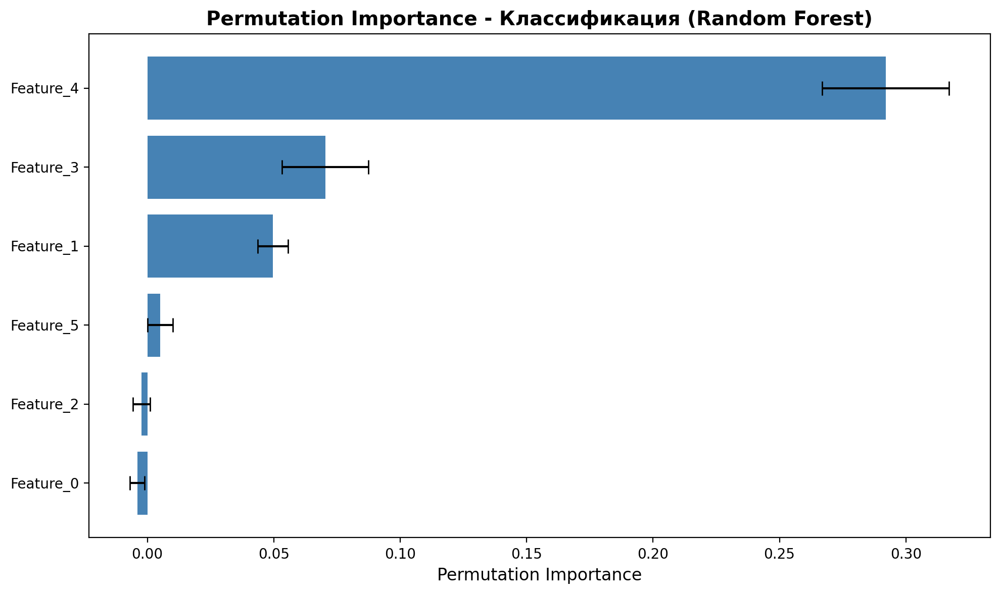

Permutation Importance для классификации:
     Feature  Importance       Std
4  Feature_4    0.292000  0.025131
3  Feature_3    0.070333  0.017026
1  Feature_1    0.049667  0.006046
5  Feature_5    0.005000  0.005000
2  Feature_2   -0.002333  0.003350
0  Feature_0   -0.004000  0.002906


In [40]:
from sklearn.datasets import make_classification

X_synth_clf_perm, y_synth_clf_perm = make_classification(
    n_samples=1000, n_features=6, n_informative=3, n_redundant=1,
    n_clusters_per_class=1, random_state=42
)

X_train_clf_perm, X_test_clf_perm, y_train_clf_perm, y_test_clf_perm = train_test_split(
    X_synth_clf_perm, y_synth_clf_perm, test_size=0.3, random_state=42
)

rf_clf_perm = RandomForestClassifier(n_estimators=100, random_state=42)
rf_clf_perm.fit(X_train_clf_perm, y_train_clf_perm)

feature_names_clf_perm = [f'Feature_{i}' for i in range(X_synth_clf_perm.shape[1])]
importance_df_clf = plot_permutation_importance(
    rf_clf_perm, X_test_clf_perm, y_test_clf_perm, feature_names_clf_perm,
    n_repeats=10, random_state=42, scoring='accuracy', n_jobs=-1,
    title='Permutation Importance - Классификация (Random Forest)'
)

print("Permutation Importance для классификации:")
print(importance_df_clf)


Применим Permutation Importance к датасету MAGIC и сравним результаты с другими методами оценки важности признаков.


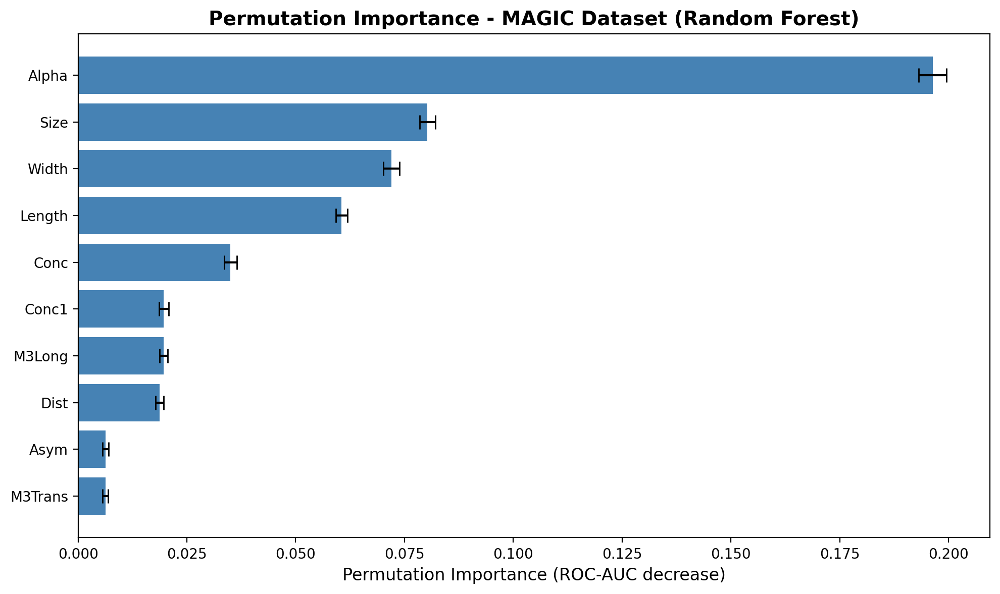

Permutation Importance для датасета MAGIC:
   Feature  Importance       Std
8    Alpha    0.196374  0.003184
2     Size    0.080293  0.001763
1    Width    0.071948  0.001860
0   Length    0.060544  0.001366
3     Conc    0.035014  0.001470
4    Conc1    0.019695  0.001074
6   M3Long    0.019691  0.000925
9     Dist    0.018705  0.000951
5     Asym    0.006353  0.000713
7  M3Trans    0.006310  0.000634


In [41]:
rf_magic_perm = RandomForestClassifier(n_estimators=100, random_state=42)
rf_magic_perm.fit(X_train, y_train)

importance_df_magic = plot_permutation_importance(
    rf_magic_perm, X_test, y_test, columns,
    n_repeats=10, random_state=42, scoring='roc_auc', n_jobs=-1,
    title='Permutation Importance - MAGIC Dataset (Random Forest)',
    xlabel='Permutation Importance (ROC-AUC decrease)',
    color='steelblue'
)

print("Permutation Importance для датасета MAGIC:")
print(importance_df_magic)


Сравним Permutation Importance с встроенной важностью Random Forest для датасета MAGIC:


Сравнение методов для датасета MAGIC:
   Feature  Permutation Importance  Built-in Importance
8   Length                0.196374             0.156662
2    Width                0.080293             0.116670
1     Size                0.071948             0.110422
0     Conc                0.060544             0.061434
3    Conc1                0.035014             0.055834
4     Asym                0.019695             0.050972
6   M3Long                0.019691             0.088849
9  M3Trans                0.018705             0.051719
5    Alpha                0.006353             0.236464
7     Dist                0.006310             0.070973


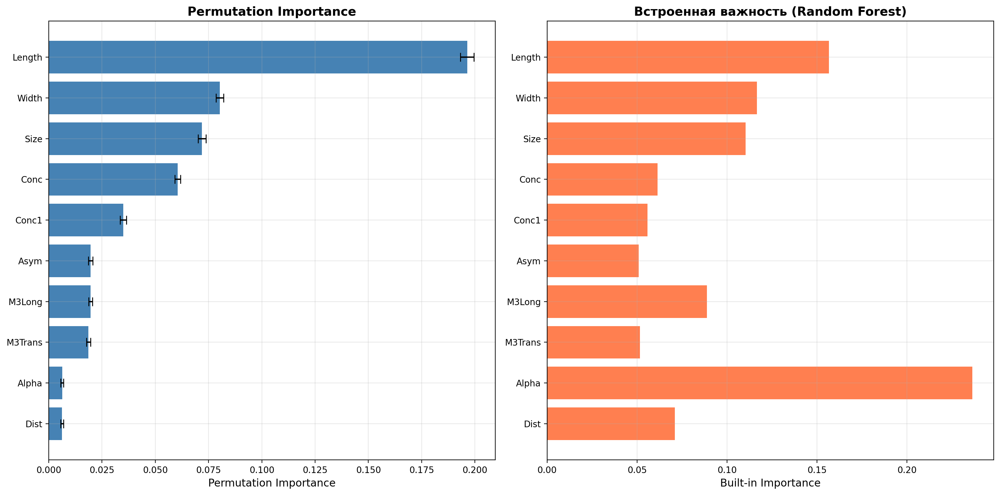

In [42]:
builtin_importance_magic = rf_magic_perm.feature_importances_

comparison_magic_df = pd.DataFrame({
    'Feature': columns,
    'Permutation Importance': importance_df_magic["Importance"],
    'Built-in Importance': builtin_importance_magic
}).sort_values('Permutation Importance', ascending=False)

print("Сравнение методов для датасета MAGIC:")
print(comparison_magic_df)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 8))

sort_idx = comparison_magic_df.index
y_pos = np.arange(len(comparison_magic_df))

ax1.barh(y_pos, comparison_magic_df['Permutation Importance'], 
         xerr=importance_df_magic.loc[sort_idx, "Std"], capsize=5, color='steelblue')
ax1.set_yticks(y_pos)
ax1.set_yticklabels(comparison_magic_df['Feature'])
ax1.set_xlabel('Permutation Importance', fontsize=12)
ax1.set_title('Permutation Importance', fontsize=14, fontweight='bold')
ax1.invert_yaxis()
ax1.grid(True, alpha=0.3)

ax2.barh(y_pos, comparison_magic_df['Built-in Importance'], color='coral')
ax2.set_yticks(y_pos)
ax2.set_yticklabels(comparison_magic_df['Feature'])
ax2.set_xlabel('Built-in Importance', fontsize=12)
ax2.set_title('Встроенная важность (Random Forest)', fontsize=14, fontweight='bold')
ax2.invert_yaxis()
ax2.grid(True, alpha=0.3)

plt.tight_layout()
plt.show()


Также применим Permutation Importance к линейной модели для сравнения:


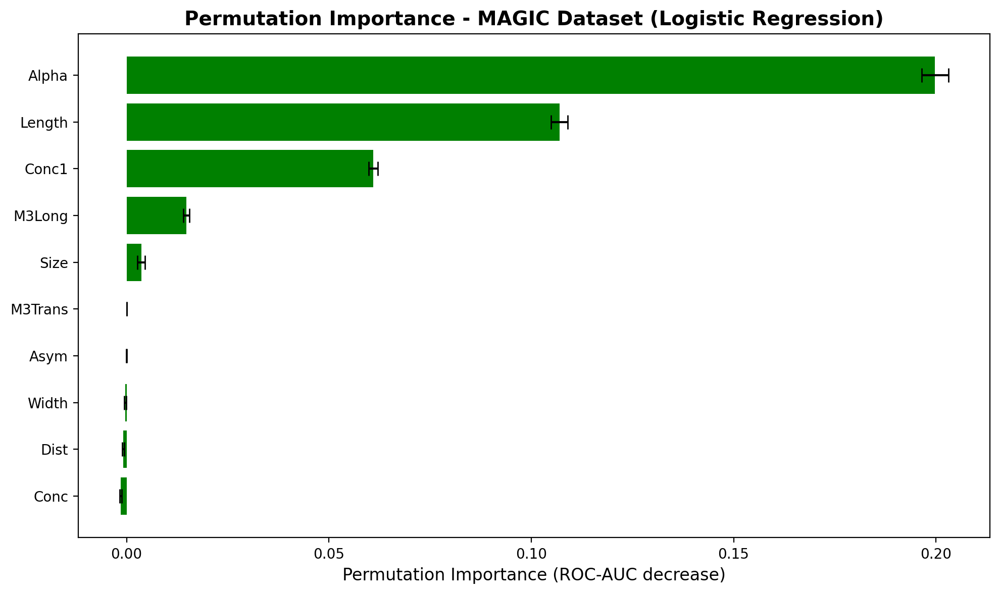

Permutation Importance для Logistic Regression (MAGIC):
   Feature    Importance       Std
8    Alpha  1.997752e-01  0.003329
0   Length  1.069617e-01  0.002063
4    Conc1  6.093163e-02  0.001144
6   M3Long  1.477874e-02  0.000797
2     Size  3.607717e-03  0.000990
7  M3Trans  3.731491e-05  0.000054
5     Asym -3.249414e-07  0.000037
1    Width -3.265661e-04  0.000249
9     Dist -8.140606e-04  0.000236
3     Conc -1.491379e-03  0.000256


In [43]:
scaler_magic_perm = StandardScaler()
X_train_magic_scaled_perm = scaler_magic_perm.fit_transform(X_train)
X_test_magic_scaled_perm = scaler_magic_perm.transform(X_test)

lr_magic_perm = LogisticRegression(max_iter=1000, random_state=42)
lr_magic_perm.fit(X_train_magic_scaled_perm, y_train)

importance_df_magic_lr = plot_permutation_importance(
    lr_magic_perm, X_test_magic_scaled_perm, y_test, columns,
    n_repeats=10, random_state=42, scoring='roc_auc', n_jobs=-1,
    title='Permutation Importance - MAGIC Dataset (Logistic Regression)',
    xlabel='Permutation Importance (ROC-AUC decrease)',
    color='green'
)

print("Permutation Importance для Logistic Regression (MAGIC):")
print(importance_df_magic_lr)


Одним из важных ограничений Permutation Importance является его поведение при наличии коррелированных признаков. Если два признака сильно коррелированы, то при перемешивании одного из них модель может использовать информацию из коррелированного признака, что приведет к занижению важности обоих признаков.При наличии сильно коррелированных признаков важно интерпретировать результаты с осторожностью. Можно рассмотреть группировку коррелированных признаков или использование других методов интерпретации.

Кроме того, Permutation Importance зависит от выбранной метрики качества. Выбор метрики должен соответствовать бизнес-задаче. Например, если важна точность предсказания определенного класса, следует использовать соответствующую метрику.

Иногда Permutation Importance может быть отрицательной. Это означает, что перемешивание признака **улучшило** качество модели. Возможные причины:

1. **Переобучение**: Модель переобучилась на шум в этом признаке
2. **Случайность**: При малом количестве повторений возможны случайные флуктуации
3. **Корреляция**: При наличии коррелированных признаков перемешивание одного может случайно улучшить предсказания


### Мультиколлинеарность

При наличии сильно коррелированных признаков permutation importance может недооценивать важность признаков. Если два признака сильно коррелированы, при перемешивании одного из них модель может использовать информацию из коррелированного признака, что приводит к занижению важности обоих.

Для корректной оценки важности признаков при мультиколлинеарности можно использовать кластеризацию признаков по корреляции и оценивать важность кластеров признаков, а не отдельных признаков.

Рассмотрим эту ситуацию на примере wbcd.

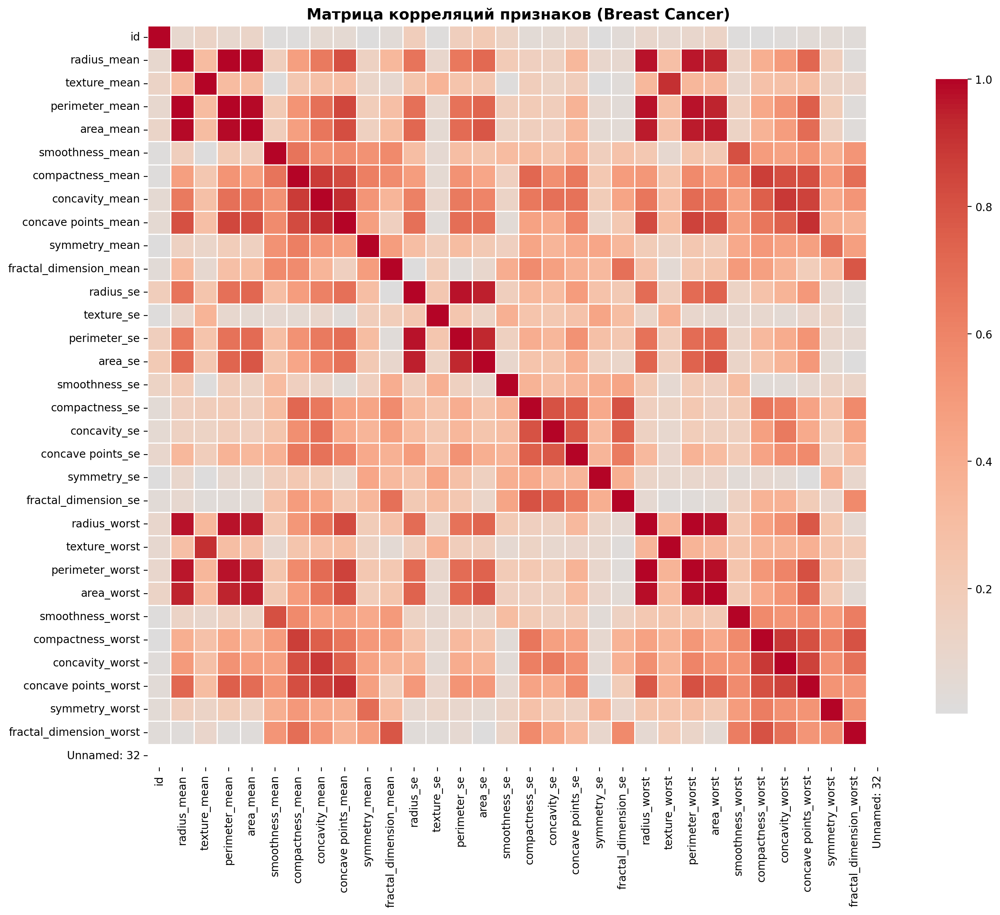

In [44]:
import seaborn as sns

data_bc =  pd.read_csv(pjoin(data_path, "wdbc", "data.csv"))
X_bc = data_bc.drop("diagnosis", axis=1)
y_bc = data_bc["diagnosis"]

X_train_bc, X_test_bc, y_train_bc, y_test_bc = train_test_split(
    X_bc, y_bc, test_size=0.2, random_state=42
)

corr_matrix = X_train_bc.corr().abs()

plt.figure(figsize=(14, 12))
sns.heatmap(corr_matrix, cmap='coolwarm', center=0, square=True, 
            linewidths=0.5, cbar_kws={"shrink": 0.8}, fmt='.2f')
plt.title('Матрица корреляций признаков (Breast Cancer)', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()


In [45]:
rf_bc = RandomForestClassifier(n_estimators=100, random_state=42)
rf_bc.fit(X_train_bc, y_train_bc)
print(
    "Accuracy on test data with all feature: {:.2f}".format(
        rf_bc.score(X_test_bc, y_test_bc)
    )
)

Accuracy on test data with all feature: 0.96


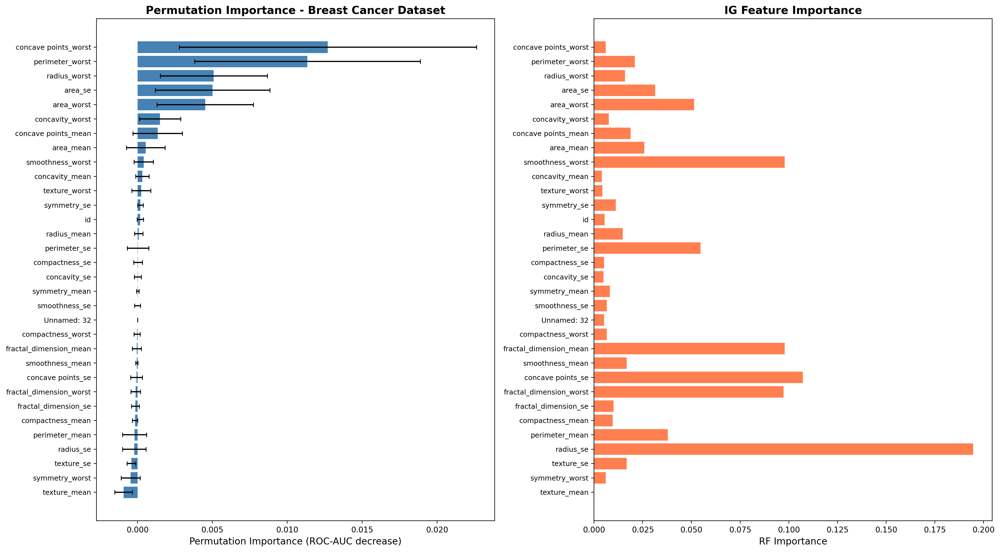

In [46]:
importance_df_bc = plot_permutation_importance(
    rf_bc, X_test_bc, y_test_bc, X_bc.columns,
    n_repeats=10, random_state=42, scoring='roc_auc',
    show_plot=False
)

rf_importance = rf_bc.feature_importances_
importance_df_bc['RF Importance'] = rf_importance

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 10))

y_pos = np.arange(len(importance_df_bc))
ax1.barh(y_pos, importance_df_bc['Importance'], 
        xerr=importance_df_bc['Std'], capsize=3, color='steelblue')
ax1.set_yticks(y_pos)
ax1.set_yticklabels(importance_df_bc['Feature'], fontsize=9)
ax1.set_xlabel('Permutation Importance (ROC-AUC decrease)', fontsize=12)
ax1.set_title('Permutation Importance - Breast Cancer Dataset', fontsize=14, fontweight='bold')
ax1.invert_yaxis()

ax2.barh(y_pos, importance_df_bc['RF Importance'], color='coral')
ax2.set_yticks(y_pos)
ax2.set_yticklabels(importance_df_bc['Feature'], fontsize=9)
ax2.set_xlabel('RF Importance', fontsize=12)
ax2.set_title('IG Feature Importance', fontsize=14, fontweight='bold')
ax2.invert_yaxis()

plt.tight_layout()
plt.show()

Один из способов обработки мультиколлинеарных признаков — выполнение иерархической кластеризации на основе корреляций, выбор порога и сохранение одного признака из каждого кластера.

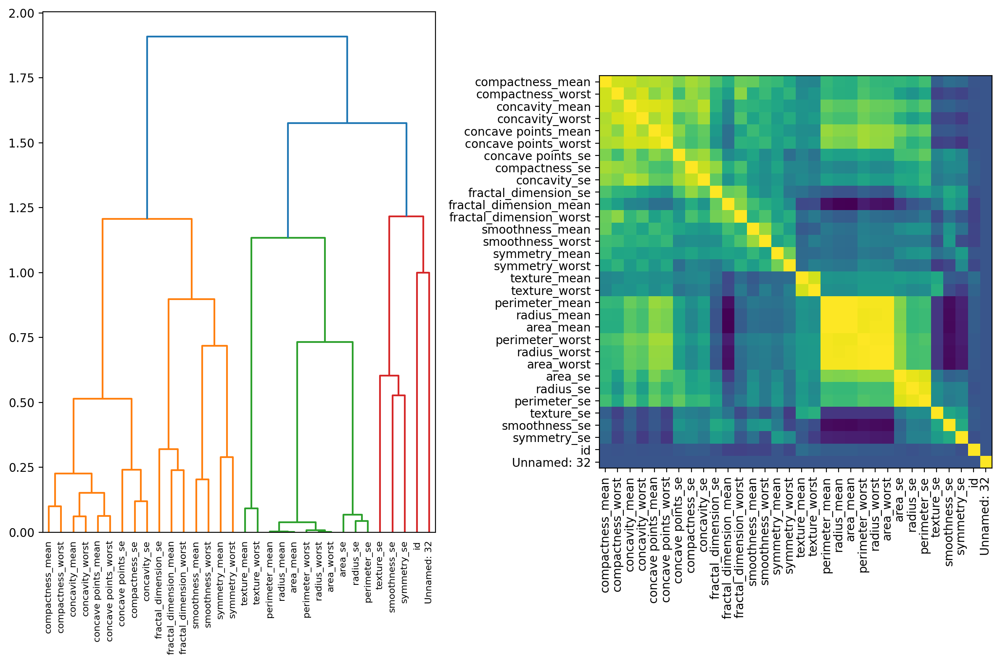

In [47]:
from scipy.stats import spearmanr
from scipy.cluster import hierarchy
from scipy.spatial.distance import squareform

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 8))
corr = np.nan_to_num(spearmanr(X_bc).correlation) # don't need target
# Ensure the correlation matrix is symmetric - it's important to use it as distance
corr = (corr + corr.T) / 2
np.fill_diagonal(corr, 1)
distance_matrix = 1 - np.abs(corr)

# We perform Ward clustering, because it builds dense and similar-size clusters.
dist_linkage = hierarchy.ward(squareform(distance_matrix))
dendro = hierarchy.dendrogram(
    dist_linkage, labels=X_bc.columns.tolist(), ax=ax1, leaf_rotation=90
)
dendro_idx = np.arange(0, len(dendro["ivl"]))

ax2.imshow(corr[dendro["leaves"], :][:, dendro["leaves"]])
ax2.set_xticks(dendro_idx)
ax2.set_yticks(dendro_idx)
ax2.set_xticklabels(dendro["ivl"], rotation="vertical")
ax2.set_yticklabels(dendro["ivl"])
fig.tight_layout()
plt.show()

Задание: постройте карту корреляций с дендрограммой силами sklearn. Насколько отличаются дендрограммы? По возможности объясните разницу (или укажите, что там используется тот же алгоритм)

Далее мы можем выбрать необходимый нам уровень кластеров, чтобы выбрать признак для оценки. 

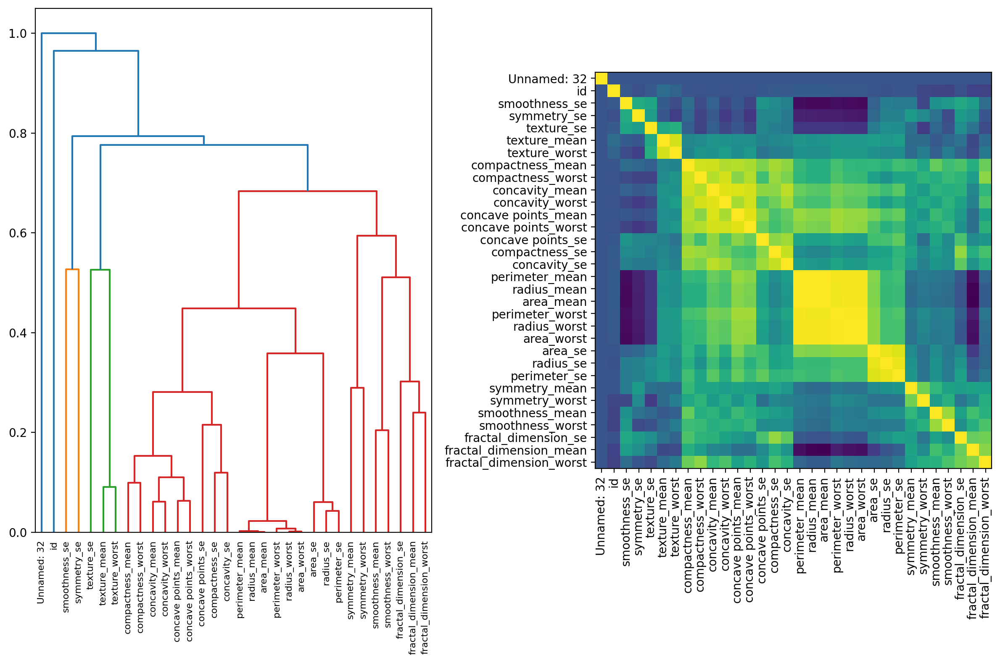

In [48]:
# дендрограмма через sklearn

from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram

corr = np.nan_to_num(spearmanr(X_bc).correlation)
corr = (corr + corr.T) / 2
np.fill_diagonal(corr, 1)

distance_matrix = 1 - np.abs(corr)

clustering = AgglomerativeClustering(
    n_clusters=None,
    metric="precomputed",
    linkage="average",
    distance_threshold=0
)

clustering.fit(distance_matrix)

counts = np.zeros(clustering.children_.shape[0])

n_samples = len(clustering.labels_)

for i, merge in enumerate(clustering.children_):
    current_count = 0
    
    for child_idx in merge:
        if child_idx < n_samples:
            current_count += 1
        else:
            current_count += counts[child_idx - n_samples]
            
    counts[i] = current_count

linkage_matrix = np.column_stack([
    clustering.children_,
    clustering.distances_,
    counts
]).astype(float)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 8))

dendro = dendrogram(
    linkage_matrix,
    labels=X_bc.columns.tolist(),
    ax=ax1,
    leaf_rotation=90
)

dendro_idx = np.arange(len(dendro["ivl"]))

ax2.imshow(corr[dendro["leaves"], :][:, dendro["leaves"]])
ax2.set_xticks(dendro_idx)
ax2.set_yticks(dendro_idx)
ax2.set_xticklabels(dendro["ivl"], rotation="vertical")
ax2.set_yticklabels(dendro["ivl"])

plt.tight_layout()
plt.show()

In [49]:
from collections import defaultdict


cluster_ids = hierarchy.fcluster(dist_linkage, 1, criterion="distance")
cluster_id_to_feature_ids = defaultdict(list)
for idx, cluster_id in enumerate(cluster_ids):
    cluster_id_to_feature_ids[cluster_id].append(idx)
selected_features = [X_train_bc.columns[v[1]] for v in cluster_id_to_feature_ids.values()]
print(f"Selected features: {selected_features}")

X_train_sel = X_train_bc[selected_features]
X_test_sel = X_test_bc[selected_features]

rf_sel = RandomForestClassifier(n_estimators=100, random_state=42)
rf_sel.fit(X_train_sel, y_train_bc)
print(
    "Accuracy on test data with features removed: {:.2f}".format(
        rf_sel.score(X_test_sel, y_test_bc)
    )
)

Selected features: ['Unnamed: 32', 'perimeter_mean', 'texture_worst', 'symmetry_mean', 'concavity_mean', 'smoothness_se']
Accuracy on test data with features removed: 0.96


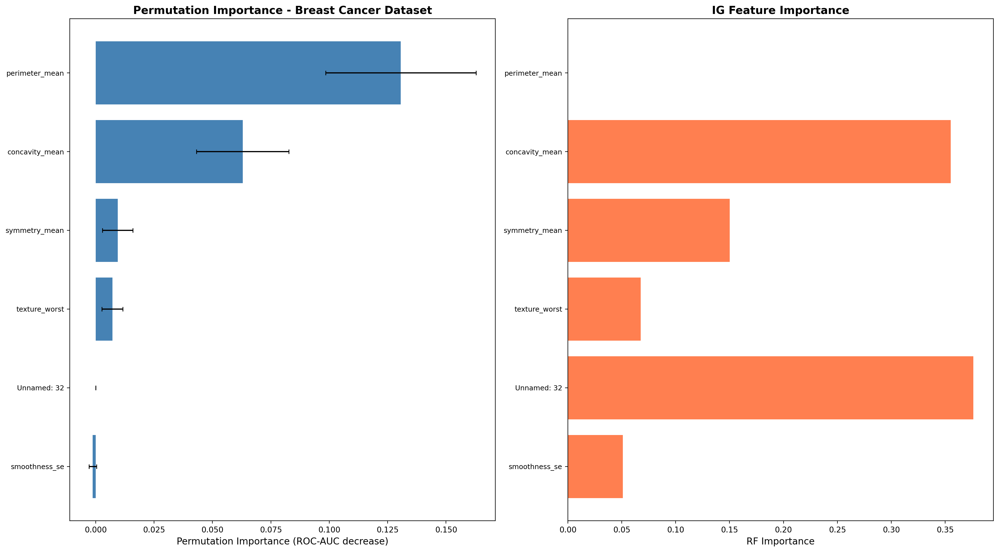

In [50]:

importance_df_bc = plot_permutation_importance(
    rf_sel, X_test_sel, y_test_bc, selected_features,
    n_repeats=10, random_state=42, scoring='roc_auc',
    show_plot=False
)

rf_importance = rf_sel.feature_importances_
importance_df_bc['RF Importance'] = rf_importance

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(18, 10))

y_pos = np.arange(len(importance_df_bc))
ax1.barh(y_pos, importance_df_bc['Importance'], 
        xerr=importance_df_bc['Std'], capsize=3, color='steelblue')
ax1.set_yticks(y_pos)
ax1.set_yticklabels(importance_df_bc['Feature'], fontsize=9)
ax1.set_xlabel('Permutation Importance (ROC-AUC decrease)', fontsize=12)
ax1.set_title('Permutation Importance - Breast Cancer Dataset', fontsize=14, fontweight='bold')
ax1.invert_yaxis()

ax2.barh(y_pos, importance_df_bc['RF Importance'], color='coral')
ax2.set_yticks(y_pos)
ax2.set_yticklabels(importance_df_bc['Feature'], fontsize=9)
ax2.set_xlabel('RF Importance', fontsize=12)
ax2.set_title('IG Feature Importance', fontsize=14, fontweight='bold')
ax2.invert_yaxis()

plt.tight_layout()
plt.show()

Задание: Покажите влияние мультиколлинеарности на F-statistic, проверив признаки WDBC в разном порядке. Как меняется важность при смене порядка?

In [55]:
from sklearn.preprocessing import LabelEncoder
from sklearn.impute import SimpleImputer

X_train_bc_num = X_train_bc.select_dtypes(include=[np.number])

X_train_bc_num = X_train_bc_num.dropna(axis=1, how="all")

imputer = SimpleImputer(strategy="median")

X_train_bc_filled = pd.DataFrame(
    imputer.fit_transform(X_train_bc_num),
    columns=X_train_bc_num.columns
)

y_bc_num = LabelEncoder().fit_transform(y_train_bc)


def sequential_f_test(X_df, y, feature_order):
    results = []
    n = len(y)
    X_prev = None

    for i, feature in enumerate(feature_order):
        X_cur = X_df[feature_order[:i + 1]].values

        full_model = LinearRegression()
        full_model.fit(X_cur, y)

        y_pred_full = full_model.predict(X_cur)
        sse_full = np.sum((y - y_pred_full) ** 2)

        if i == 0:
            sse_base = np.sum((y - np.mean(y)) ** 2)
            p_full = 1
        else:
            base_model = LinearRegression()
            base_model.fit(X_prev, y)

            y_pred_base = base_model.predict(X_prev)
            sse_base = np.sum((y - y_pred_base) ** 2)
            p_full = i + 1

        f_stat = ((sse_base - sse_full) / 1) / (sse_full / (n - p_full - 1))

        results.append({
            "feature": feature,
            "step": i + 1,
            "f_stat": f_stat
        })

        X_prev = X_cur

    return pd.DataFrame(results)


orders = {
    "original order": list(X_train_bc_filled.columns),
    "reversed order": list(X_train_bc_filled.columns[::-1]),
    "random order": list(np.random.RandomState(42).permutation(X_train_bc_filled.columns))
}

all_results = []

for order_name, feature_order in orders.items():
    cur_result = sequential_f_test(X_train_bc_filled, y_bc_num, feature_order)
    cur_result["order"] = order_name
    all_results.append(cur_result)

sequential_f_results = pd.concat(all_results, ignore_index=True)

pivot_f = sequential_f_results.pivot_table(
    index="feature",
    columns="order",
    values="f_stat"
)

pivot_f

order,original order,random order,reversed order
feature,,,
area_mean,13.258910,0.986700,0.021126
area_se,1.742138,0.734446,5.432783
area_worst,21.446208,7.117332,50.842493
compactness_mean,5.669316,10.809943,14.147369
compactness_se,6.655745,13.362374,0.677464
compactness_worst,22.509127,0.107354,0.184607
concave points_mean,28.486497,12.495922,10.297637
concave points_se,0.041774,6.374999,1.862221
concave points_worst,1.341709,1.634532,550.565129


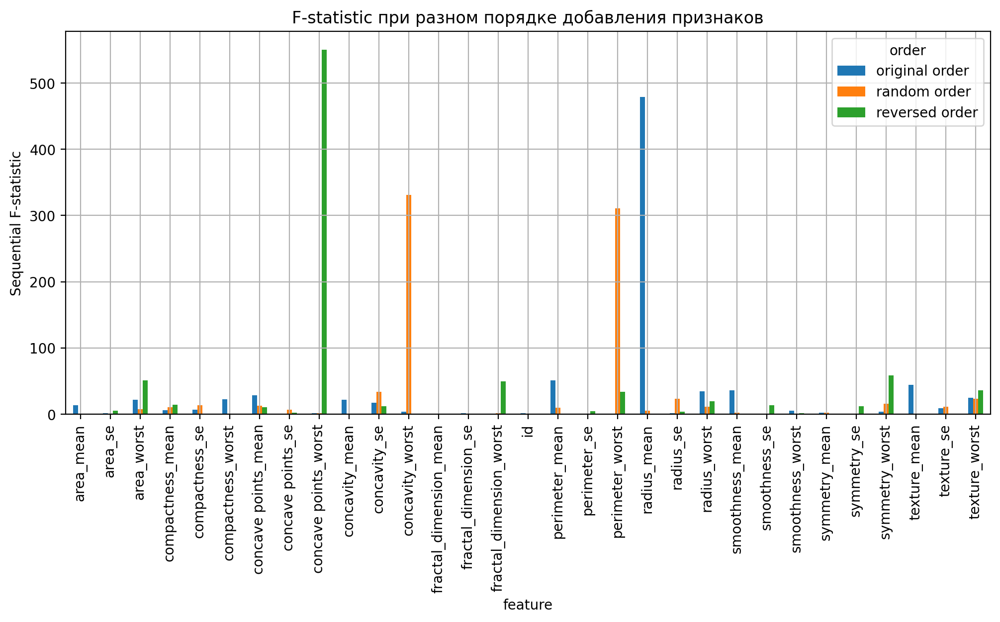

In [56]:
pivot_f.plot(kind="bar", figsize=(12, 5))

plt.ylabel("Sequential F-statistic")
plt.title("F-statistic при разном порядке добавления признаков")
plt.grid()
plt.show()

## Feature selection
Как же перейти от простой оценки важности признаков к поиску такого подмножества, которое приведет к наибольшей точности модели?
Можно использовать рекурсиввный выбор признаков (Recursive feature selection, или RFE).
RFE работает путем поиска подмножества признаков, начиная со всех признаков в наборе и постепенно удаляя самые незначимые, пока не останется желаемое количество.

Это достигается путем подбора модели для оценки, ранжирования признаков по важности, отбрасывания наименее важного признака и повторного обучения модели. Этот процесс повторяется до тех пор, пока не останется заданное количество признаков. Характеристики оцениваются либо с использованием предоставленной модели, либо с использованием статистического метода, такого как f-score или IG.

В sklearn реализован класс трансформера для такого подбора, при этом подюор может быть отделен от основной модели. 

In [57]:
# scaler = StandardScaler()
rfe = RFE(estimator=RandomForestRegressor(), n_features_to_select=5)
model = LogisticRegression()
#pipeline = Pipeline(steps=[('sc',scaler),('s',rfe),('m',model)])
pipeline = Pipeline(steps=[('s',rfe),('m',model)])
# evaluate model
pipeline.fit(X_train, y_train)
print_feature_names(rfe.get_feature_names_out(), columns)
# evaluate the model
y_hat = pipeline.predict(X_test)
# evaluate predictions
acc = accuracy_score(y_test, y_hat)
print('Accuracy: %.3f' % acc)

Selected features: ['Length', 'Width', 'Size', 'M3Long', 'Alpha']
Accuracy: 0.789


**Задание**: Реализуйте данный метод вручную. Бонусное задание: реализуйте класс трансформера для подбора и/или конфигурируемые метрику и модель.

In [61]:
from sklearn.base import clone

def get_importances(model):
    if hasattr(model, "feature_importances_"):
        return model.feature_importances_
    
    if hasattr(model, "coef_"):
        return np.abs(model.coef_).ravel()
    
    raise ValueError("Model should have feature_importances_ or coef_")


def find_best_features_set(X_train, y_train, X_test, y_test, model, columns):
    X_train_curr = X_train.copy()
    X_test_curr = X_test.copy()
    f_names_curr = np.array(columns).copy()

    scores = []
    selected_features_history = []

    while X_train_curr.shape[1] > 0:
        cur_model = clone(model)
        cur_model.fit(X_train_curr, y_train)

        yhat = cur_model.predict(X_test_curr)
        score = accuracy_score(y_test, yhat)

        scores.append(score)
        selected_features_history.append(f_names_curr.copy())

        print("Num features:", X_train_curr.shape[1])
        print("Score:", np.round(score, 4))
        print("Features:", list(f_names_curr))
        print()

        if X_train_curr.shape[1] == 1:
            break

        importances = get_importances(cur_model)

        worst_feature_idx = np.argmin(importances)

        X_train_curr = np.delete(X_train_curr, worst_feature_idx, axis=1)
        X_test_curr = np.delete(X_test_curr, worst_feature_idx, axis=1)
        f_names_curr = np.delete(f_names_curr, worst_feature_idx)

    return scores, selected_features_history

In [62]:
model = RandomForestClassifier(n_estimators=100, random_state=42)

scores, selected_features_history = find_best_features_set(
    X_train,
    y_train,
    X_test,
    y_test,
    model,
    columns
)

Num features: 10
Score: 0.8707
Features: [np.str_('Length'), np.str_('Width'), np.str_('Size'), np.str_('Conc'), np.str_('Conc1'), np.str_('Asym'), np.str_('M3Long'), np.str_('M3Trans'), np.str_('Alpha'), np.str_('Dist')]

Num features: 9
Score: 0.8728
Features: [np.str_('Length'), np.str_('Width'), np.str_('Size'), np.str_('Conc'), np.str_('Conc1'), np.str_('M3Long'), np.str_('M3Trans'), np.str_('Alpha'), np.str_('Dist')]

Num features: 8
Score: 0.8736
Features: [np.str_('Length'), np.str_('Width'), np.str_('Size'), np.str_('Conc'), np.str_('Conc1'), np.str_('M3Long'), np.str_('Alpha'), np.str_('Dist')]

Num features: 7
Score: 0.8725
Features: [np.str_('Length'), np.str_('Width'), np.str_('Size'), np.str_('Conc'), np.str_('M3Long'), np.str_('Alpha'), np.str_('Dist')]

Num features: 6
Score: 0.8696
Features: [np.str_('Length'), np.str_('Width'), np.str_('Size'), np.str_('Conc'), np.str_('M3Long'), np.str_('Alpha')]

Num features: 5
Score: 0.8682
Features: [np.str_('Length'), np.str_('W

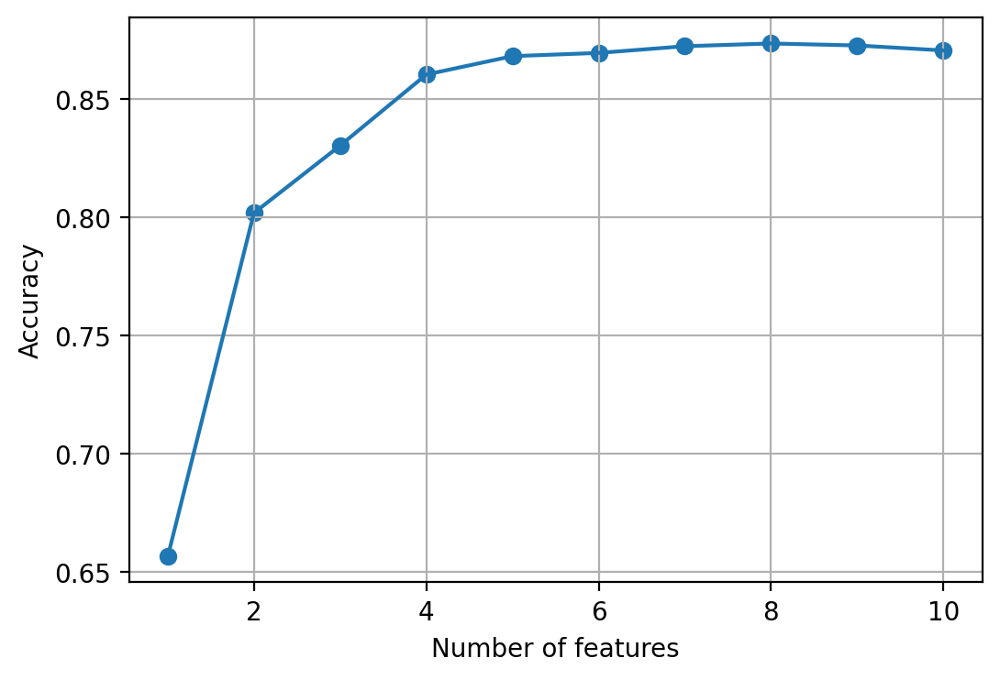

In [63]:
nf = np.arange(len(scores), 0, -1)

plt.figure(figsize=(6, 4))
plt.plot(nf, scores)
plt.scatter(nf, scores)

plt.xlabel("Number of features")
plt.ylabel("Accuracy")
plt.grid()
plt.show()

In [64]:
best_idx = np.argmax(scores)

print("Best score:", scores[best_idx])
print("Best number of features:", len(selected_features_history[best_idx]))
print("Best features:", list(selected_features_history[best_idx]))

Best score: 0.8736067297581493
Best number of features: 8
Best features: [np.str_('Length'), np.str_('Width'), np.str_('Size'), np.str_('Conc'), np.str_('Conc1'), np.str_('M3Long'), np.str_('Alpha'), np.str_('Dist')]


### PCA

[Ноутбук Евгения Соколова](https://github.com/esokolov/ml-course-hse/blob/master/2022-spring/seminars/sem14_pca_tsne.ipynb)

Выделение новых признаков путем их отбора часто дает плохие результаты, и в некоторых ситуациях такой подход практически бесполезен. Например, если мы работаем с изображениями, у которых признаками являются яркости пикселей,
невозможно выбрать небольшой поднабор пикселей, который дает хорошую информацию о содержимом картинки. Поэтому признаки нужно как-то комбинировать.\n",

__Метод главных компонент__ &mdash; один из самых интуитивно простых и часто используемых методов для снижения размерности данных и проекции их на ортогональное подпространство признаков. В рамках метода делается два важных упрощения задачи:
1. игнорируется целевая переменная;
2. строится линейная комбинация признаков.
П. 1 на первый взгляд кажется довольно странным, но на практике обычно не является таким уж плохим. Это связано с тем, что часто данные устроены так, что имеют какую-то внутреннюю структуру в пространстве меньшей размерности, которая никак не связана с целевой переменной. Поэтому и оптимальные признаки можно строить не глядя на ответ.
П. 2 тоже сильно упрощает задачу, но далее мы научимся избавляться от него.

PCA ищет линейную комбинацию переменных, чтобы мы могли извлечь максимальную дисперсию из них. По завершении этого процесса он удаляет ее и ищет другую линейную комбинацию (фактор), которая дает объяснение максимальной пропорции оставшейся дисперсии, что приводит к ортогональным факторам. Это повторяется столько раз, чтобы достигнуть целевого числа объясненной дисперсии или числа факторов.

### Теория
Кратко вспомним, что делает этот метод.
Пусть $X$ &mdash; матрица объекты-признаки, с нулевым средним каждого признака, а $w$ &mdash; некоторый единичный вектор. Тогда $Xw$ задает величину проекций всех объектов на этот вектор. Далее ищется вектор, который дает наибольшую дисперсию полученных проекций (то есть наибольшую дисперсию вдоль этого направления):
$$\max_{w: \|w\|=1} \| Xw \|^2 =  \max_{w: \|w\|=1} w^T X^T X w$$
Подходящий вектор тогда равен собственному вектору матрицы $X^T X$ с наибольшим собственным значением. После этого все пространство проецируется на ортогональное дополнение к вектору $w$ и процесс повторяется.
   

In [65]:
np.random.seed(314512)

data_synth_1 = np.random.multivariate_normal(
    mean=[0, 0],
    cov=[[4, 0],
         [0, 1]],
    size=1000
)

Теперь изобразим точки выборки на плоскости и применим к ним PCA для нахождения главных компонент. В результате работы PCA из sklearn в dec.components_ будут лежать главные направления (нормированные), а в dec.explained_variance_ — дисперсия, которую объясняет каждая компонента. Изобразим на нашем графике эти направления, умножив их на дисперсию для наглядного отображения их значимости.

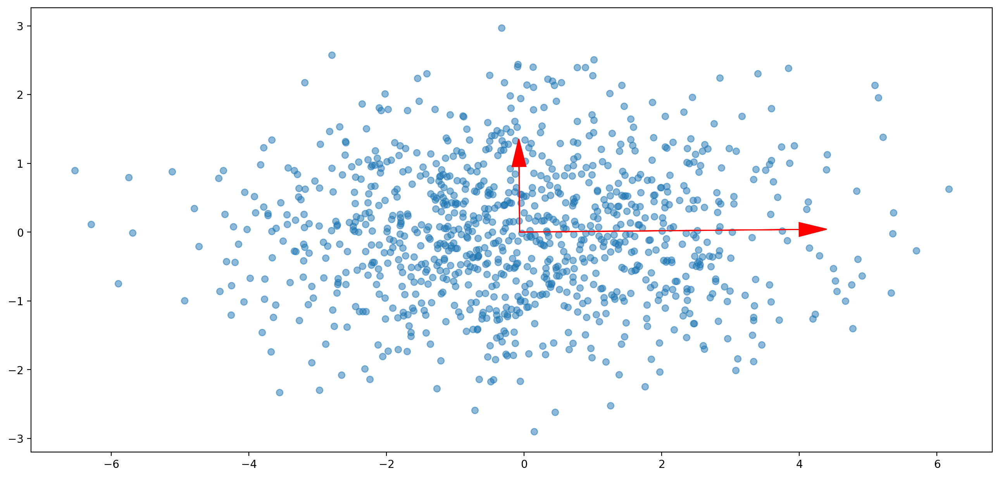

In [66]:
from sklearn.decomposition import PCA

def PCA_show(dataset):
    plt.scatter(*zip(*dataset), alpha=0.5)

    dec = PCA()
    dec.fit(dataset)
    ax = plt.gca()
    for comp_ind in range(dec.components_.shape[0]):
        component = dec.components_[comp_ind, :]
        var = dec.explained_variance_[comp_ind]
        start, end = dec.mean_, component * var
        ax.arrow(start[0], start[1], end[0], end[1],
                 head_width=0.2, head_length=0.4, fc='r', ec='r')

    ax.set_aspect('equal', adjustable='box')

plt.figure(figsize=(16, 8))
PCA_show(data_synth_1)

Видим, что PCA все правильно нашел. Но это, конечно, можно было сделать и просто посчитав дисперсию каждого признака. Повернем наши данные на некоторый фиксированный угол и проверим, что для PCA это ничего не изменит.

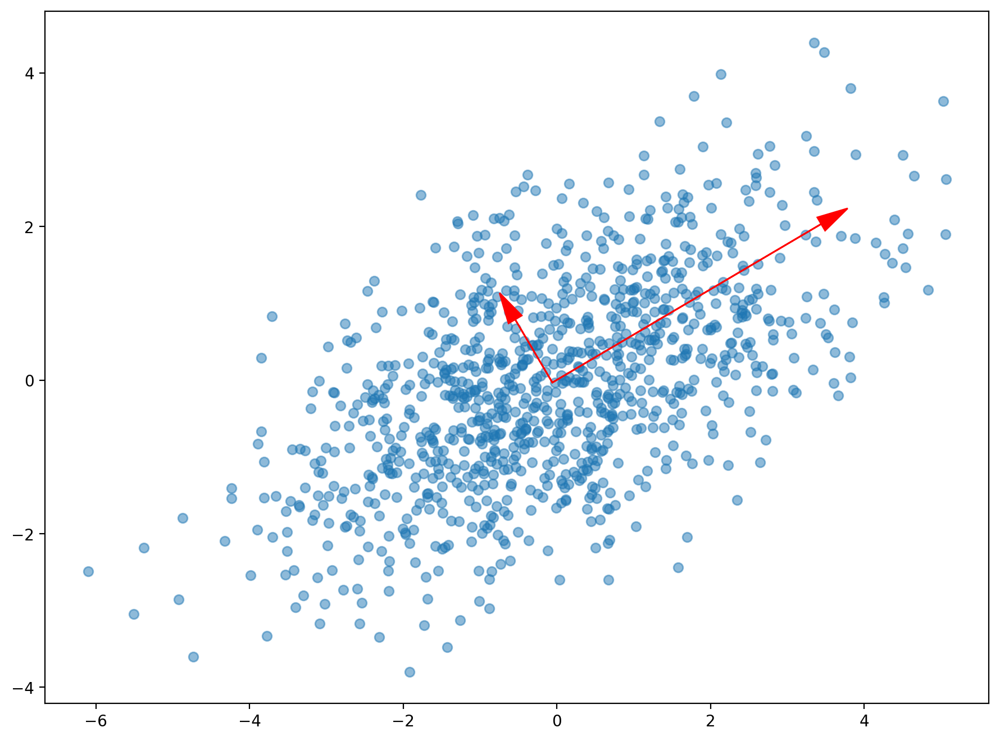

In [68]:
angle = np.pi / 6
rotate = np.array([
        [np.cos(angle), - np.sin(angle)],
        [np.sin(angle), np.cos(angle)],
    ])
data_synth_2 = rotate.dot(data_synth_1.T).T

plt.figure(figsize=(16, 8))
PCA_show(data_synth_2)

Ниже пара примеров, где PCA отработал не так хорошо (в том смысле, что направления задают не очень хорошие признаки).

Вопрос: почему так произошло?

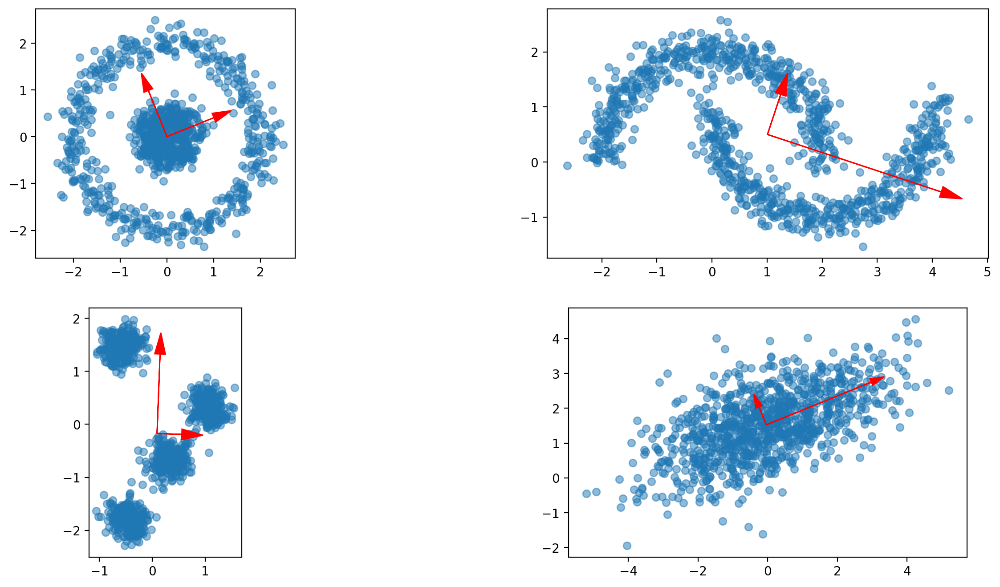

In [69]:
from sklearn.datasets import make_circles, make_moons, make_blobs

np.random.seed(54242)

data_synth_bad = [
    make_circles(n_samples=1000, factor=0.2, noise=0.1)[0]*2,
    make_moons(n_samples=1000, noise=0.1)[0]*2,
    make_blobs(n_samples=1000, n_features=2, centers=4)[0]/5,
    np.random.multivariate_normal(
        mean=[0, 1.5],
        cov=[[3, 1],
             [1, 1]],
        size=1000),
]

plt.figure(figsize=(16,8))
rows, cols = 2, 2
for i, data in enumerate(data_synth_bad):
    plt.subplot(rows, cols, i + 1)
    PCA_show(data)

In [70]:
scaler = StandardScaler()


Доп.задание : Запустите предыдущий метод с учетом скейлинга. Поменяется ли результат?

In [71]:
pca = PCA(n_components = 5)
pipeline = Pipeline(steps=[('sc', scaler), ('pca',pca),('m',model)])
# evaluate model
pipeline.fit(X_train, y_train)
pcas = " ".join(f"{i:.2}" for i in pca.explained_variance_ratio_)
print(f"Explained {pcas} ({pca.explained_variance_ratio_.sum():.2f}) ratio of variance")
# evaluate the model
y_hat = pipeline.predict(X_test)
# evaluate predictions
mae = mean_absolute_error(y_test, y_hat)
print('MAE: %.3f' % mae)

Explained 0.42 0.16 0.1 0.1 0.073 (0.85) ratio of variance
MAE: 0.189


Почему важно использование скейлинга перед проведением PCA?
Если один объект варьируется больше, чем другие, только из-за их соответствующих масштабов, PCA определит, что такой объект доминирует в направлении главных компонентов.

In [72]:
pca = PCA(n_components = 5)
pipeline = Pipeline(steps=[('pca',pca),('m',model)])
# evaluate model
pipeline.fit(X_train, y_train)
pcas = " ".join(f"{i:.2}" for i in pca.explained_variance_ratio_)
print(f"Explained {pcas} ({pca.explained_variance_ratio_.sum():.2f}) ratio of variance")
# evaluate the model
y_hat = pipeline.predict(X_test)
# evaluate predictions
mae = mean_absolute_error(y_test, y_hat)
print('MAE: %.3f' % mae)

Explained 0.44 0.26 0.13 0.09 0.04 (0.96) ratio of variance
MAE: 0.188


 Какой метод наиболее страдает от проклятия размерности?
 KNN.

 Покажем это.

Рассмотрим набор MNIST - набор рукописных чисел от 0 до 9. Это один из классических наборов для компьютернорго зроения, состоящий из 100 тысяч черно-белых изображений 28х28. Однако матрицы можно и вытянуть в вектор, чтобы предсказывать класс в табличном формате. Тогда мы получим пространство признаков размера 784!

In [73]:
mnist = fetch_openml('mnist_784', cache=False)

X = mnist["data"].astype('float64')
X.reset_index()
y = mnist["target"].astype('int64')
y.reset_index()

print("\nNo. of Samples: ", X.shape)
print("No. of Labels: ", y.shape)


No. of Samples:  (70000, 784)
No. of Labels:  (70000,)


Так выглядит набор данных в табличном виде

In [74]:
X.head()

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


Рассмотрим случайный семпл в данных (преобразовав обратно в матрицу)

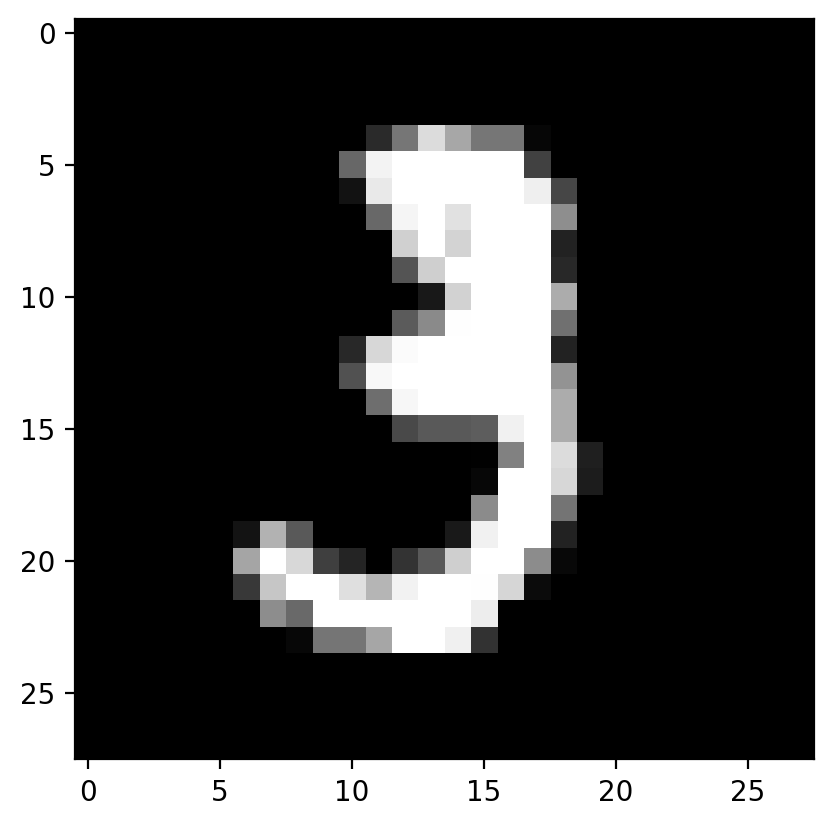

In [75]:
random_digit = X.loc[10,:].values

random_digit_image = random_digit.reshape(28, 28)

plt.imshow(random_digit_image, cmap = 'gray', interpolation="nearest")
#plt.axis("off")
plt.show()


Отнормируем

In [76]:
X /= 255.0


In [77]:
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)

Заодно с обучением модели вспомним о поиске гиперпараметров. Что это такое?

param_grid = {'n_neighbors': [3, 4, 5, 9], 'p': [1, 2, 1000], 'weights': ["uniform", "distance"]}


knn_clf = KNeighborsClassifier()

knn_cv = GridSearchCV(knn_clf, param_grid, scoring='f1_micro', cv=5, verbose=1, n_jobs=-1)
knn_cv.fit(X_train, y_train)


params_optimal_knn = knn_cv.best_params_

print("Best Score: %f" % knn_cv.best_score_)
print("Optimal Hyperparameter Values: ", params_optimal_knn)
print("\n")

Так как данных очень много, сделаем равномерно засемплим 1000 точек. В общем случае это плохая практика. Почему?

In [78]:
random_indices = np.random.choice(X.index, 10000, replace=False)
X_rus = X.loc[random_indices]
y_rus = y.loc[random_indices]

In [79]:
X_train, X_test, y_train, y_test = train_test_split(X_rus, y_rus, test_size=0.2, random_state=0)
print(X_train.shape, y_test.shape)

(8000, 784) (2000,)


In [80]:
param_grid = {'n_neighbors': [3, 4], 'p': [2], 'weights': ["distance"]}


knn_clf = KNeighborsClassifier()

knn_cv = GridSearchCV(knn_clf, param_grid, scoring='f1_micro', cv=5, verbose=1, n_jobs=-1)
knn_cv.fit(X_train, y_train)


params_optimal_knn = knn_cv.best_params_

print("Best Score: %f" % knn_cv.best_score_)
print("Optimal Hyperparameter Values: ", params_optimal_knn)
print("\n")

Fitting 5 folds for each of 2 candidates, totalling 10 fits
Best Score: 0.941250
Optimal Hyperparameter Values:  {'n_neighbors': 4, 'p': 2, 'weights': 'distance'}




In [81]:
%%time
knn = KNeighborsClassifier(**params_optimal_knn)

knn.fit(X_train, y_train)

y_train_predicted = knn.predict(X_train)

train_accuracy_knn = np.mean(y_train_predicted == y_train)
print("\nTraining Accuracy: ", train_accuracy_knn)


Training Accuracy:  1.0
CPU times: total: 9.05 s
Wall time: 4.37 s


In [82]:
%%time

y_train_pred = cross_val_predict(knn, X_train, y_train, cv=5)
confusion_matrix(y_train, y_train_pred)

CPU times: total: 12.5 s
Wall time: 1.14 s


array([[786,   1,   1,   1,   0,   3,   5,   1,   0,   1],
       [  0, 889,   3,   2,   2,   0,   2,   0,   0,   0],
       [ 12,  16, 723,  10,   3,   0,   5,  15,   4,   2],
       [  0,   8,   7, 789,   0,  20,   2,   9,   7,   5],
       [  0,   9,   0,   0, 701,   0,   5,   5,   0,  33],
       [  5,   5,   0,  11,   1, 707,  16,   0,   5,  10],
       [  5,   6,   3,   0,   3,   7, 737,   0,   1,   0],
       [  1,  16,   0,   1,   5,   1,   0, 766,   0,  24],
       [  2,  15,   4,  21,   5,  24,   3,   6, 665,  15],
       [  5,   5,   0,   7,  13,   4,   0,  12,   4, 767]])

In [83]:

y_test_predicted = knn.predict(X_test)

test_accuracy_knn = np.mean(y_test_predicted == y_test)
print("\nTraining Accuracy: ", test_accuracy_knn)


Training Accuracy:  0.949


In [84]:
%%time

# The accuracy of the model
test_accuracy_knn = knn.score(X_test, y_test)
print("\nTest Accuracy: ", test_accuracy_knn)


# No. of Correct Predictions
y_test_predicted = knn.predict(X_test)
print("\nNo. of correct predictions (Test): %d/%d" % (np.sum(y_test_predicted == y_test), len(y_test)))


# Confusion Matrix
print("\nConfusion Matrix (Test Data):\n", confusion_matrix(y_test, y_test_predicted))


Test Accuracy:  0.949

No. of correct predictions (Test): 1898/2000

Confusion Matrix (Test Data):
 [[176   0   0   0   0   0   0   0   0   0]
 [  0 217   0   0   1   0   0   1   0   0]
 [  1   5 181   3   2   0   1   5   0   0]
 [  0   0   1 205   0   3   0   2   1   1]
 [  0   0   0   0 194   0   0   0   0   8]
 [  2   4   0   5   0 169   2   0   0   3]
 [  1   0   0   0   0   0 222   0   0   0]
 [  0   3   1   1   0   0   0 199   0   5]
 [  0   5   2   6   1  11   0   2 158   3]
 [  1   1   0   2   3   1   0   2   0 177]]
CPU times: total: 5.27 s
Wall time: 398 ms


In [85]:
pd.crosstab(y_test, y_test_predicted, rownames=['True'], colnames=['Predicted'], margins=True)

Predicted,0,1,2,3,4,5,6,7,8,9,All
True,,,,,,,,,,,
0,176,0,0,0,0,0,0,0,0,0,176
1,0,217,0,0,1,0,0,1,0,0,219
2,1,5,181,3,2,0,1,5,0,0,198
3,0,0,1,205,0,3,0,2,1,1,213
4,0,0,0,0,194,0,0,0,0,8,202
5,2,4,0,5,0,169,2,0,0,3,185
6,1,0,0,0,0,0,222,0,0,0,223
7,0,3,1,1,0,0,0,199,0,5,209
8,0,5,2,6,1,11,0,2,158,3,188


Попробуем уменьшить влияние проклятия размерности с помощью уменьшения размерности, использовав метод PCA.

In [86]:
%%time
pca = PCA(n_components=0.95)
pca.fit(X_train)

print("Number of Principle Components: ", pca.n_components_)

Number of Principle Components:  150
CPU times: total: 3.91 s
Wall time: 493 ms


In [87]:
X_train_pca = pca.transform(X_train)
X_test_pca = pca.transform(X_test)

In [88]:
%%time


knn_pca = KNeighborsClassifier(n_neighbors=4, p=2, weights="distance")

knn_pca.fit(X_train_pca, y_train)


y_test_predicted_pca_knn = knn_pca.predict(X_test_pca)
print("KNN (PCA): Test Accuracy: ", accuracy_score(y_test, y_test_predicted_pca_knn))

print("\nKNN (PCA): Test Confusion Matrix:")
print(confusion_matrix(y_test, y_test_predicted_pca_knn))

print("\nKNN (PCA): Classification Report:")
print(classification_report(y_test, y_test_predicted_pca_knn))

print("\n")

KNN (PCA): Test Accuracy:  0.9545

KNN (PCA): Test Confusion Matrix:
[[175   0   0   0   0   1   0   0   0   0]
 [  0 217   0   0   1   0   0   1   0   0]
 [  2   3 183   2   2   0   1   5   0   0]
 [  0   0   1 206   0   2   0   2   1   1]
 [  0   1   0   0 197   0   0   0   0   4]
 [  2   3   0   5   0 169   3   0   0   3]
 [  0   0   0   0   0   0 223   0   0   0]
 [  0   3   1   0   1   0   0 199   0   5]
 [  0   4   0   6   1  10   0   2 162   3]
 [  1   1   0   2   3   1   0   1   0 178]]

KNN (PCA): Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.99      0.98       176
           1       0.94      0.99      0.96       219
           2       0.99      0.92      0.96       198
           3       0.93      0.97      0.95       213
           4       0.96      0.98      0.97       202
           5       0.92      0.91      0.92       185
           6       0.98      1.00      0.99       223
           7       0.95      0.9

Мы видим, что после уменьшения размерности мы можем снизить стоимость расчета расстояния в K-NN, что приводит к значительному сокращению времени обучения. При этом мы не потеряли в точности, а даже выиграли!

Для сравнения времени обучения рассмотрим метод, построенный не на расстоянии - случайный лес. Эта модель будет страдать от проклятия размерности в терминах времени меньше.

In [89]:
%%time

forest_clf = RandomForestClassifier(n_estimators=1000, criterion="gini", 
                                    max_depth=32, class_weight="balanced", oob_score=True, verbose=1, n_jobs=-1)

forest_clf.fit(X_train, y_train)

y_test_predicted_rf = forest_clf.predict(X_test)
print("Random Forest: Test Accuracy: ", accuracy_score(y_test, y_test_predicted_rf))

print("\nRandom Forest: Test Confusion Matrix:")
print(confusion_matrix(y_test, y_test_predicted_rf))

print("\nRandom Forest: Classification Report:")
print(classification_report(y_test, y_test_predicted_rf))

print("\n")

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.2s
[Parallel(n_jobs=-1)]: Done 160 tasks      | elapsed:    0.8s
[Parallel(n_jobs=-1)]: Done 410 tasks      | elapsed:    1.8s
[Parallel(n_jobs=-1)]: Done 760 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done 1000 out of 1000 | elapsed:    4.2s finished
[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done 160 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done 410 tasks      | elapsed:    0.0s


Random Forest: Test Accuracy:  0.9565

Random Forest: Test Confusion Matrix:
[[175   0   0   0   0   1   0   0   0   0]
 [  0 213   2   2   0   0   0   1   1   0]
 [  0   1 190   1   2   0   1   2   1   0]
 [  0   1   3 203   0   2   0   3   1   0]
 [  0   0   0   0 194   0   0   0   2   6]
 [  0   2   0   4   1 173   2   0   3   0]
 [  1   1   0   0   0   1 218   0   2   0]
 [  0   0   5   2   1   0   0 197   0   4]
 [  0   1   0   2   3   3   2   0 174   3]
 [  2   0   0   4   3   0   0   1   1 176]]

Random Forest: Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.99      0.99       176
           1       0.97      0.97      0.97       219
           2       0.95      0.96      0.95       198
           3       0.93      0.95      0.94       213
           4       0.95      0.96      0.96       202
           5       0.96      0.94      0.95       185
           6       0.98      0.98      0.98       223
           7       0

[Parallel(n_jobs=20)]: Done 760 tasks      | elapsed:    0.2s
[Parallel(n_jobs=20)]: Done 1000 out of 1000 | elapsed:    0.2s finished


In [90]:
%%time

forest_clf = RandomForestClassifier(n_estimators=1000, criterion="gini", 
                                    max_depth=32, class_weight="balanced", oob_score=True, verbose=1, n_jobs=-1)

forest_clf.fit(X_train_pca, y_train)

y_test_predicted_rf = forest_clf.predict(X_test_pca)
print("Random Forest: Test Accuracy: ", accuracy_score(y_test, y_test_predicted_rf))

print("\nRandom Forest: Test Confusion Matrix:")
print(confusion_matrix(y_test, y_test_predicted_rf))

print("\nRandom Forest: Classification Report:")
print(classification_report(y_test, y_test_predicted_rf))

print("\n")

[Parallel(n_jobs=-1)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=-1)]: Done  10 tasks      | elapsed:    0.1s
[Parallel(n_jobs=-1)]: Done 160 tasks      | elapsed:    1.3s
[Parallel(n_jobs=-1)]: Done 410 tasks      | elapsed:    3.3s
[Parallel(n_jobs=-1)]: Done 760 tasks      | elapsed:    5.9s
[Parallel(n_jobs=-1)]: Done 1000 out of 1000 | elapsed:    7.7s finished
[Parallel(n_jobs=20)]: Using backend ThreadingBackend with 20 concurrent workers.
[Parallel(n_jobs=20)]: Done  10 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done 160 tasks      | elapsed:    0.0s
[Parallel(n_jobs=20)]: Done 410 tasks      | elapsed:    0.1s


Random Forest: Test Accuracy:  0.936

Random Forest: Test Confusion Matrix:
[[176   0   0   0   0   0   0   0   0   0]
 [  0 213   1   1   0   1   1   1   1   0]
 [  1   0 182   5   2   0   1   2   5   0]
 [  0   1   2 199   0   2   1   1   7   0]
 [  1   0   1   0 192   1   0   0   1   6]
 [  4   1   2   7   2 162   3   0   1   3]
 [  2   1   2   1   0   3 213   0   1   0]
 [  1   1   2   3   1   0   0 197   1   3]
 [  0   1   1   7   5   4   0   1 166   3]
 [  1   0   1   4   8   0   0   0   1 172]]

Random Forest: Classification Report:
              precision    recall  f1-score   support

           0       0.95      1.00      0.97       176
           1       0.98      0.97      0.97       219
           2       0.94      0.92      0.93       198
           3       0.88      0.93      0.90       213
           4       0.91      0.95      0.93       202
           5       0.94      0.88      0.91       185
           6       0.97      0.96      0.96       223
           7       0.

[Parallel(n_jobs=20)]: Done 760 tasks      | elapsed:    0.2s
[Parallel(n_jobs=20)]: Done 1000 out of 1000 | elapsed:    0.3s finished


In [91]:
X_train_big, X_test_big, y_train_big, y_test_big = train_test_split(X, y, test_size=0.2, random_state=0)
print(X_train_big.shape, y_test_big.shape)

(56000, 784) (14000,)


%%time

forest_clf = RandomForestClassifier(n_estimators=1000, criterion="gini", 
                                    max_depth=32, class_weight="balanced", oob_score=True, verbose=1, n_jobs=-1)

forest_clf.fit(X_train_big, y_train_big)

y_test_predicted_rf = forest_clf.predict(X_test_big)
print("Random Forest: Test Accuracy: ", accuracy_score(y_test_big, y_test_predicted_rf))

print("\nRandom Forest: Test Confusion Matrix:")
print(confusion_matrix(y_test_big, y_test_predicted_rf))

print("\nRandom Forest: Classification Report:")
print(classification_report(y_test_big, y_test_predicted_rf))

print("\n")

Как видно, обучение произошло гораздо быстрее, при этом точность алгоритма даже выше, чем у KNN